In [1]:
# Import pandas, numpy, and matplotlib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# seaborn is a data visualization library built on matplotlib
import seaborn as sns 

# set the plotting style 
sns.set_style("whitegrid")

# plot tree model
import graphviz

# Plot missing values
import missingno as msno

# Model preprocessing
from sklearn import preprocessing
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler

# Train-test splits
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, KFold, RandomizedSearchCV

# Models
from sklearn import linear_model, tree
import statsmodels.api as sm
from sklearn.ensemble import RandomForestRegressor

# Model metrics and analysis
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from statsmodels.stats.anova import anova_lm

# Imputation
from sklearn.impute import KNNImputer
#from fancyimpute import IterativeImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, IterativeImputer

## Clean the data

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/he-chang/data5100project/main/university_data.csv')

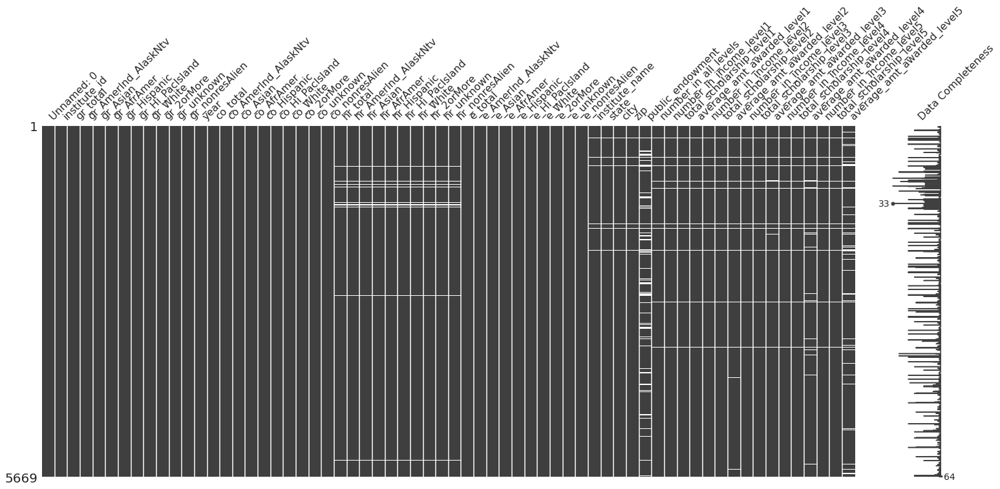

In [3]:
msno.matrix(df, labels = True);

The missing elements appeared most for hr values, endowments, and financial aid information was missing more.  Missing endowments and average amount awarded per income levels were assumed to be 0 if not reported.

In [4]:
df['public_endowment'] = df['public_endowment'].fillna(0)
df['average_amt_awarded_level2'] = df['average_amt_awarded_level2'].fillna(0)
df['average_amt_awarded_level3'] = df['average_amt_awarded_level3'].fillna(0)
df['average_amt_awarded_level4'] = df['average_amt_awarded_level4'].fillna(0)
df['average_amt_awarded_level5'] = df['average_amt_awarded_level5'].fillna(0)

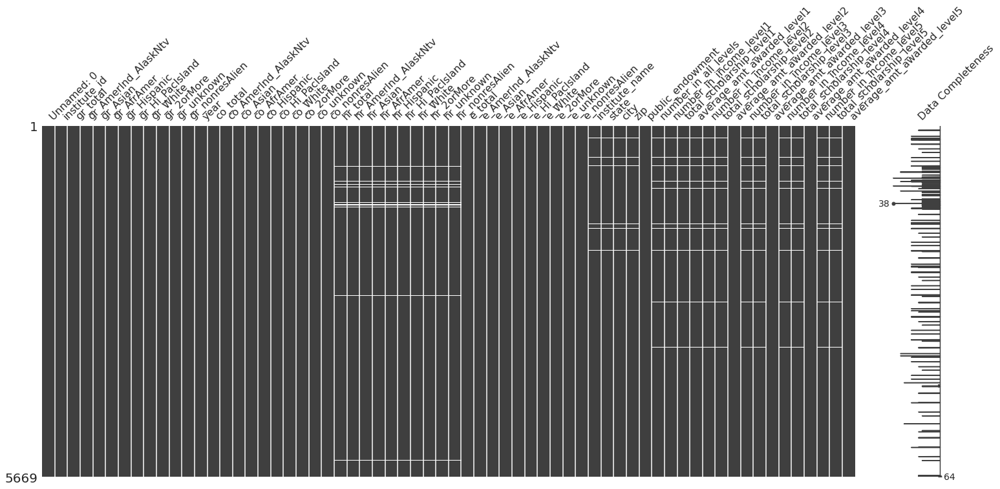

In [5]:
msno.matrix(df, labels = True);

In [6]:
# The remaning rows with missing information were dropped because they appeared random.
df = df.dropna()

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5436 entries, 0 to 5668
Data columns (total 64 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Unnamed: 0                  5436 non-null   int64  
 1   institute_id                5436 non-null   int64  
 2   gr_total                    5436 non-null   float64
 3   gr_AmerInd_AlaskNtv         5436 non-null   float64
 4   gr_Asian                    5436 non-null   float64
 5   gr_AfrAmer                  5436 non-null   float64
 6   gr_Hispanic                 5436 non-null   float64
 7   gr_Hi_PacIsland             5436 non-null   float64
 8   gr_White                    5436 non-null   float64
 9   gr_2orMore                  5436 non-null   float64
 10  gr_unknown                  5436 non-null   float64
 11  gr_nonresAlien              5436 non-null   float64
 12  year                        5436 non-null   int64  
 13  co_total                    5436 

## Calculate Student Income Percentages

In [8]:
# Function to calculate the percentages
def calcPercentage(overall_total, group_total):
  if overall_total == 0:
    return 0
  else:
    return group_total / overall_total

In [9]:
income_groups = ['number_in_income_level1', 'number_in_income_level2', 'number_in_income_level3', 'number_in_income_level4', 'number_in_income_level5']

for group in income_groups:
  new_column_name = group + "_pct"
  df[new_column_name] = df.apply(lambda x: calcPercentage(x['number_in_all_levels'], x[group]), axis = 1)

In [10]:
def calculateRange(income_lvl1, income_lvl2, income_lvl3, income_lvl4, income_lvl5):
  income_list = [income_lvl1, income_lvl2, income_lvl3, income_lvl4, income_lvl5]
  income_max = max(income_list)
  income_min = min(income_list)
  return income_max - income_min

In [11]:
def calculateMax(income_lvl1, income_lvl2, income_lvl3, income_lvl4, income_lvl5):
  income_list = [income_lvl1, income_lvl2, income_lvl3, income_lvl4, income_lvl5]
  income_max = max(income_list)

  return income_list.index(income_max) + 1

In [12]:
df['income_range'] = df.apply(lambda x: calculateRange(x['number_in_income_level1_pct'], x['number_in_income_level2_pct'], x['number_in_income_level3_pct'], x['number_in_income_level4_pct'], x['number_in_income_level5_pct']), axis = 1)
df['income_level_majority'] = df.apply(lambda x: calculateMax(x['number_in_income_level1_pct'], x['number_in_income_level2_pct'], x['number_in_income_level3_pct'], x['number_in_income_level4_pct'], x['number_in_income_level5_pct']), axis = 1)

## Calculate Percentages

In [13]:
# graduation rate is grad total / cohort total
def getCohortGroupTotal(group_name):
  new_group_name = group_name
  return new_group_name.replace("gr", "co")

In [14]:
# calculate cohort percentage
cohort_groups = ['co_AmerInd_AlaskNtv', 'co_AmerInd_AlaskNtv', 'co_AmerInd_AlaskNtv', 'co_Asian', 'co_AfrAmer', 'co_Hispanic', 'co_Hi_PacIsland', 'co_White', 'co_2orMore', 'co_unknown', 'co_nonresAlien']

for group in cohort_groups:
  new_column_name = group + "_pct"
  df[new_column_name] = df.apply(lambda x: calcPercentage(x['co_total'], x[group]), axis = 1)

df.head()

,Unnamed: 0,institute_id,gr_total,gr_AmerInd_AlaskNtv,gr_Asian,gr_AfrAmer,gr_Hispanic,gr_Hi_PacIsland,gr_White,gr_2orMore,...,income_level_majority,co_AmerInd_AlaskNtv_pct,co_Asian_pct,co_AfrAmer_pct,co_Hispanic_pct,co_Hi_PacIsland_pct,co_White_pct,co_2orMore_pct,co_unknown_pct,co_nonresAlien_pct
0,0,100654,257.0,0.0,0.0,252.0,1.0,0.0,2.0,0.0,...,1,0.001134,0.000000,0.977324,0.005669,0.0,0.010204,0.000000,0.000000,0.005669
1,1,100663,741.0,2.0,51.0,181.0,17.0,0.0,441.0,19.0,...,1,0.002177,0.054427,0.253266,0.019594,0.0,0.605951,0.021771,0.026125,0.016691
2,2,100706,367.0,10.0,13.0,50.0,6.0,0.0,264.0,7.0,...,1,0.019763,0.026350,0.139657,0.022398,0.0,0.747036,0.014493,0.003953,0.026350
3,3,100724,340.0,0.0,0.0,332.0,1.0,0.0,1.0,2.0,...,1,0.000000,0.000000,0.974093,0.002961,0.0,0.008882,0.001480,0.009623,0.002961
4,4,100751,2958.0,15.0,36.0,214.0,55.0,0.0,2623.0,0.0,...,1,0.004507,0.011492,0.085174,0.017125,0.0,0.876521,0.000000,0.000000,0.005183


In [15]:
# Calculate graduation precentage
grad_groups = ['gr_total', 'gr_AmerInd_AlaskNtv', 'gr_Asian', 'gr_AfrAmer', 'gr_Hispanic', 'gr_Hi_PacIsland', 'gr_White', 'gr_2orMore', 'gr_unknown', 'gr_nonresAlien']

for group in grad_groups:
  new_column_name = group + "_pct"
  total_group = getCohortGroupTotal(group)
  df[new_column_name] = df.apply(lambda x: calcPercentage(x[total_group], x[group]), axis = 1)

df.head()

,Unnamed: 0,institute_id,gr_total,gr_AmerInd_AlaskNtv,gr_Asian,gr_AfrAmer,gr_Hispanic,gr_Hi_PacIsland,gr_White,gr_2orMore,...,gr_total_pct,gr_AmerInd_AlaskNtv_pct,gr_Asian_pct,gr_AfrAmer_pct,gr_Hispanic_pct,gr_Hi_PacIsland_pct,gr_White_pct,gr_2orMore_pct,gr_unknown_pct,gr_nonresAlien_pct
0,0,100654,257.0,0.0,0.0,252.0,1.0,0.0,2.0,0.0,...,0.291383,0.000000,0.000000,0.292343,0.200000,0.0,0.222222,0.000000,0.000000,0.400000
1,1,100663,741.0,2.0,51.0,181.0,17.0,0.0,441.0,19.0,...,0.537736,0.666667,0.680000,0.518625,0.629630,0.0,0.528144,0.633333,0.416667,0.652174
2,2,100706,367.0,10.0,13.0,50.0,6.0,0.0,264.0,7.0,...,0.483531,0.666667,0.650000,0.471698,0.352941,0.0,0.465608,0.636364,0.666667,0.750000
3,3,100724,340.0,0.0,0.0,332.0,1.0,0.0,1.0,2.0,...,0.251665,0.000000,0.000000,0.252280,0.250000,0.0,0.083333,1.000000,0.307692,0.000000
4,4,100751,2958.0,15.0,36.0,214.0,55.0,0.0,2623.0,0.0,...,0.666516,0.750000,0.705882,0.566138,0.723684,0.0,0.674293,0.000000,0.000000,0.652174


In [16]:
# Calculate enrollment percentage
enr_groups = ['e_AmerInd_AlaskNtv', 'e_Asian', 'e_AfrAmer', 'e_Hispanic', 'e_Hi_PacIsland', 'e_White', 'e_2orMore', 'e_unknown', 'e_nonresAlien']

for group in enr_groups:
  new_column_name = group + "_pct"
  df[new_column_name] = df.apply(lambda x: calcPercentage(x['e_total'], x[group]), axis = 1)
  
df.head()

,Unnamed: 0,institute_id,gr_total,gr_AmerInd_AlaskNtv,gr_Asian,gr_AfrAmer,gr_Hispanic,gr_Hi_PacIsland,gr_White,gr_2orMore,...,gr_nonresAlien_pct,e_AmerInd_AlaskNtv_pct,e_Asian_pct,e_AfrAmer_pct,e_Hispanic_pct,e_Hi_PacIsland_pct,e_White_pct,e_2orMore_pct,e_unknown_pct,e_nonresAlien_pct
0,0,100654,257.0,0.0,0.0,252.0,1.0,0.0,2.0,0.0,...,0.400000,0.001594,0.006375,0.922311,0.009761,0.000797,0.050996,0.000000,0.007968,0.000199
1,1,100663,741.0,2.0,51.0,181.0,17.0,0.0,441.0,19.0,...,0.652174,0.002585,0.048470,0.211601,0.026282,0.000754,0.638356,0.028221,0.012764,0.030967
2,2,100706,367.0,10.0,13.0,50.0,6.0,0.0,264.0,7.0,...,0.750000,0.012744,0.037419,0.117001,0.030369,0.000136,0.693736,0.014507,0.033080,0.061009
3,3,100724,340.0,0.0,0.0,332.0,1.0,0.0,1.0,2.0,...,0.000000,0.001481,0.002305,0.910288,0.011687,0.000658,0.033909,0.006255,0.013663,0.019753
4,4,100751,2958.0,15.0,36.0,214.0,55.0,0.0,2623.0,0.0,...,0.652174,0.004374,0.011683,0.114612,0.029955,0.001065,0.769970,0.019913,0.004086,0.044343


In [17]:
# Calculate staff percentage
hr_groups = ['hr_AmerInd_AlaskNtv', 'hr_Asian', 'hr_AfrAmer', 'hr_Hispanic', 'hr_Hi_PacIsland', 'hr_White', 'hr_2orMore', 'hr_unknown']

for group in hr_groups:
  new_column_name = group + "_pct"
  df[new_column_name] = df.apply(lambda x: calcPercentage(x['hr_total'], x[group]), axis = 1)

df.head()

,Unnamed: 0,institute_id,gr_total,gr_AmerInd_AlaskNtv,gr_Asian,gr_AfrAmer,gr_Hispanic,gr_Hi_PacIsland,gr_White,gr_2orMore,...,e_unknown_pct,e_nonresAlien_pct,hr_AmerInd_AlaskNtv_pct,hr_Asian_pct,hr_AfrAmer_pct,hr_Hispanic_pct,hr_Hi_PacIsland_pct,hr_White_pct,hr_2orMore_pct,hr_unknown_pct
0,0,100654,257.0,0.0,0.0,252.0,1.0,0.0,2.0,0.0,...,0.007968,0.000199,0.002950,0.058997,0.761062,0.002950,0.002950,0.123894,0.000000,0.011799
1,1,100663,741.0,2.0,51.0,181.0,17.0,0.0,441.0,19.0,...,0.012764,0.030967,0.001647,0.134623,0.058872,0.028818,0.000000,0.748868,0.002470,0.000000
2,2,100706,367.0,10.0,13.0,50.0,6.0,0.0,264.0,7.0,...,0.033080,0.061009,0.002101,0.100840,0.046218,0.016807,0.000000,0.794118,0.000000,0.014706
3,3,100724,340.0,0.0,0.0,332.0,1.0,0.0,1.0,2.0,...,0.013663,0.019753,0.004890,0.066015,0.606357,0.012225,0.002445,0.229829,0.000000,0.078240
4,4,100751,2958.0,15.0,36.0,214.0,55.0,0.0,2623.0,0.0,...,0.004086,0.044343,0.000555,0.063298,0.063298,0.018323,0.000555,0.826763,0.002221,0.000000


In [18]:
# Staff BiPOC percentage = all non-white race and ethnicities staff counts added together / total staff

df['hr_BiPOC_pct'] = ((df['hr_AmerInd_AlaskNtv'] + df['hr_Asian'] + df['hr_AfrAmer'] + df['hr_Hispanic'] + df['hr_Hi_PacIsland'] + df['hr_2orMore'])/df['hr_total'])

In [19]:
# Cohort BiPOC Percentage = all non-white race and ethnicities cohort counts added together / total cohort size

df['co_BiPOC_pct'] = ((df['co_AmerInd_AlaskNtv'] + df['co_Asian'] + df['co_AfrAmer'] + df['co_Hispanic'] + df['co_Hi_PacIsland'] + df['co_2orMore'])/df['co_total'])

In [20]:
# BiPOC Graduation Percentage = all non-white race and ethnicities graduation counts added together / all non-white race and ethnicity group cohort counts added together

df['gr_BiPOC_pct'] = ((df['gr_AmerInd_AlaskNtv'] + df['gr_Asian'] + df['gr_AfrAmer'] + df['gr_Hispanic'] + df['gr_Hi_PacIsland'] + df['gr_2orMore'])/
                      ((df['co_AmerInd_AlaskNtv'] + df['co_Asian'] + df['co_AfrAmer'] + df['co_Hispanic'] + df['co_Hi_PacIsland'] + df['co_2orMore'])))

In [21]:
# BiPOC Enrollment Percentage = all non-white race and ethnicities enrollment counts added together / total enrollment count

df['e_BiPOC_pct'] = ((df['e_AmerInd_AlaskNtv'] + df['e_Asian'] + df['e_AfrAmer'] + df['e_Hispanic'] + df['e_Hi_PacIsland'] + df['e_2orMore'])/df['e_total'])

In [22]:
# Calculate the difference between the total graduation rate and BiPOC graduation rate for each school
df['gr_BiPOC_diff_pct'] = (df['gr_total_pct'] - df['gr_BiPOC_pct'])
df['gr_BiPOC_White_diff_pct'] = (df['gr_White_pct'] - df['gr_BiPOC_pct'])

## American Indian / Alaska Native Visualizations

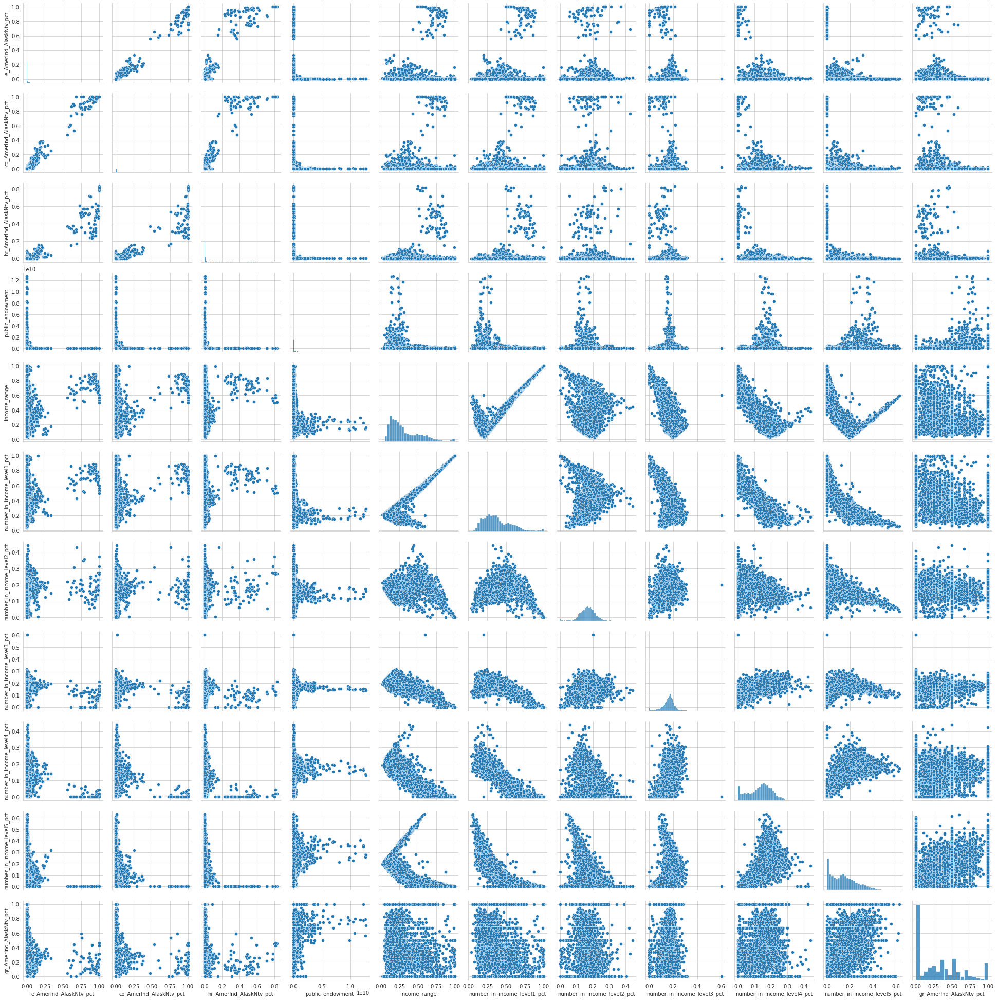

In [23]:
sns.pairplot(df[['e_AmerInd_AlaskNtv_pct', 'co_AmerInd_AlaskNtv_pct', 'hr_AmerInd_AlaskNtv_pct', 'public_endowment', 'income_range', 
                 'number_in_income_level1_pct', 'number_in_income_level2_pct', 'number_in_income_level3_pct', 'number_in_income_level4_pct', 'number_in_income_level5_pct', 'gr_AmerInd_AlaskNtv_pct']])

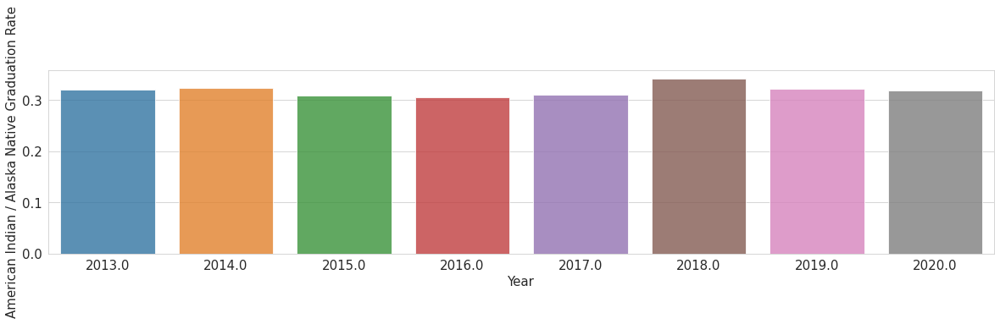

In [24]:
plt.figure(figsize = (20, 4))
df_barplot = df.groupby('year')[['year', 'gr_AmerInd_AlaskNtv_pct']].mean()
sns.barplot(data = df_barplot, x = 'year', y = 'gr_AmerInd_AlaskNtv_pct', alpha = 0.8)

plt.xlabel('Year', fontsize = 15)
plt.ylabel("American Indian / Alaska Native Graduation Rate", fontsize = 15)
plt.tick_params(labelsize = 15);

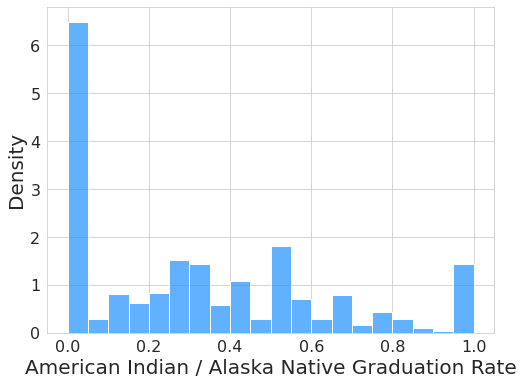

In [25]:
plt.figure(figsize = (8,6))

# Setup histogram plot
sns.histplot(data = df, x = 'gr_AmerInd_AlaskNtv_pct', bins = 20, color = 'dodgerblue', alpha = 0.7, stat = 'density')

# Label x and y axis
plt.xlabel('American Indian / Alaska Native Graduation Rate', fontsize = 20)
plt.ylabel('Density', fontsize = 20)

plt.tick_params(labelsize = 16)

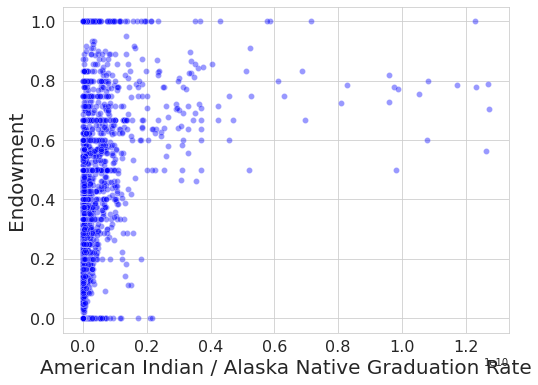

In [26]:
plt.figure(figsize = (8,6))

# Setup histogram plot
sns.scatterplot(data = df, x = 'public_endowment', y = 'gr_AmerInd_AlaskNtv_pct', color = 'blue', alpha = 0.4)

# Label x and y axis
plt.xlabel('American Indian / Alaska Native Graduation Rate', fontsize = 20)
plt.ylabel('Endowment', fontsize = 20)

plt.tick_params(labelsize = 16)

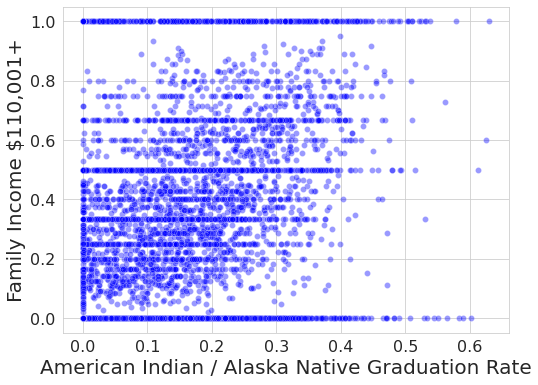

In [27]:
plt.figure(figsize = (8,6))

# Setup histogram plot
sns.scatterplot(data = df, x = 'number_in_income_level5_pct', y = 'gr_AmerInd_AlaskNtv_pct', color = 'blue', alpha = 0.4)

# Label x and y axis
plt.xlabel('American Indian / Alaska Native Graduation Rate', fontsize = 20)
plt.ylabel('Family Income $110,001+', fontsize = 20)

plt.tick_params(labelsize = 16)

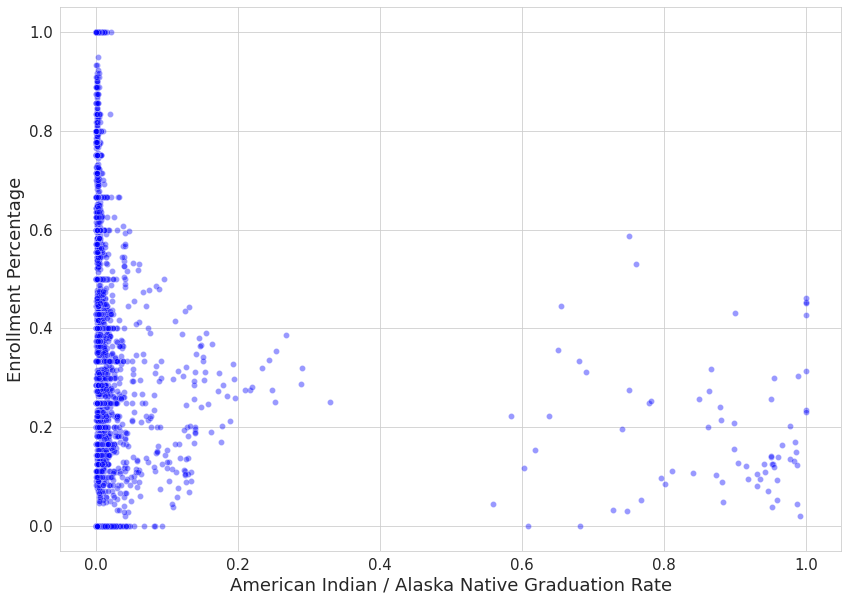

In [28]:
# Set figure size
plt.figure(figsize = (14, 10))

# Setup scatter plot for 
sns.scatterplot(data = df, x = 'e_AmerInd_AlaskNtv_pct', y = 'gr_AmerInd_AlaskNtv_pct', color = 'blue', alpha = 0.4)

# Label x and y axis
plt.xlabel('American Indian / Alaska Native Graduation Rate', fontsize = 18)
plt.ylabel('Enrollment Percentage', fontsize = 18)

plt.ticklabel_format(style='plain')
#plt.xlim(0.0, 1.0)
#plt.ylim(0.0, 1.0)

plt.tick_params(labelsize = 15);

## American Indian / Alaska Graduation Rate Modeling

In [29]:
df_clean = df.dropna()
X = df_clean[['e_AmerInd_AlaskNtv_pct', 'co_AmerInd_AlaskNtv_pct', 'hr_AmerInd_AlaskNtv_pct', 'public_endowment', 'income_range', 'number_in_income_level1_pct', 'number_in_income_level2_pct', 'number_in_income_level3_pct', 'number_in_income_level4_pct', 'number_in_income_level5_pct']]
y = df_clean['gr_AmerInd_AlaskNtv_pct']

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state = 1)

In [31]:
df_pred = pd.concat([X_test, y_test], axis = 1)

df_pred.head()

,e_AmerInd_AlaskNtv_pct,co_AmerInd_AlaskNtv_pct,hr_AmerInd_AlaskNtv_pct,public_endowment,income_range,number_in_income_level1_pct,number_in_income_level2_pct,number_in_income_level3_pct,number_in_income_level4_pct,number_in_income_level5_pct,gr_AmerInd_AlaskNtv_pct
3312,0.001142,0.003573,0.003101,61090095.0,0.146624,0.294304,0.204641,0.166667,0.186709,0.147679,0.285714
1932,0.001561,0.001151,0.001389,404522000.0,0.086842,0.160526,0.163158,0.184211,0.247368,0.244737,1.000000
3534,0.002727,0.002676,0.010876,44728060.0,0.313725,0.412565,0.223689,0.161665,0.103241,0.098840,0.375000
4376,0.001027,0.000885,0.001101,182002529.0,0.281174,0.383777,0.214891,0.167676,0.102603,0.131053,0.666667
211,0.008629,0.015556,0.002954,31634000.0,0.186851,0.311419,0.166090,0.202422,0.195502,0.124567,0.428571


## American Indian / Alaska Native Linear Regression

In [32]:
model = sm.OLS(y_train, sm.add_constant(X_train)).fit() 

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


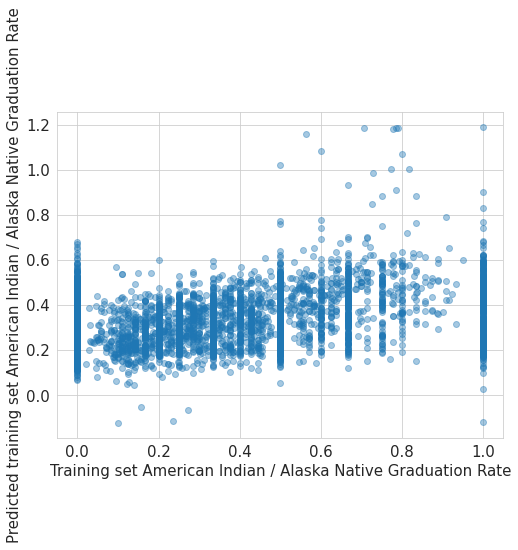

In [33]:
plt.figure(figsize = (8,6))

plt.plot(y_train, model.predict(sm.add_constant(X_train)), 'o', alpha = 0.4)

plt.xlabel('Training set American Indian / Alaska Native Graduation Rate', fontsize = 15)
plt.ylabel('Predicted training set American Indian / Alaska Native Graduation Rate', fontsize = 15)

plt.tick_params(labelsize = 15);

In [34]:
y_pred_lr = model.predict(sm.add_constant(X_test))

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


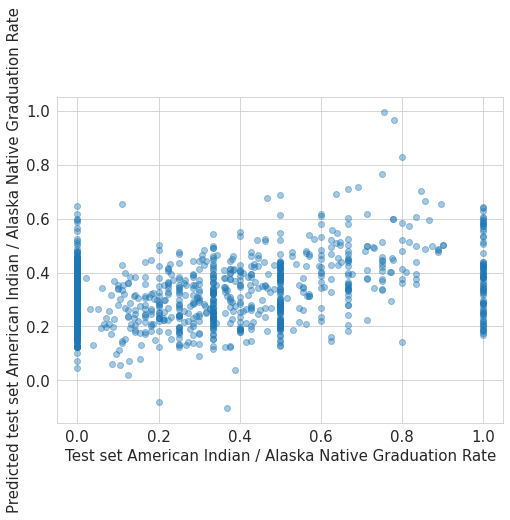

In [35]:
plt.figure(figsize = (8,6))

plt.plot(y_test, y_pred_lr, 'o', alpha = 0.4);

plt.xlabel('Test set American Indian / Alaska Native Graduation Rate', fontsize = 15)
plt.ylabel('Predicted test set American Indian / Alaska Native Graduation Rate', fontsize = 15)

plt.tick_params(labelsize = 15)

In [36]:
# Mean Squared Error
mean_squared_error(y_test, y_pred_lr, squared = False).round(3)

0.282

In [37]:
# Mean Absolute Error
mean_absolute_error(y_test, y_pred_lr).round(3)

0.227

In [38]:
print(model.summary())

                               OLS Regression Results                              
Dep. Variable:     gr_AmerInd_AlaskNtv_pct   R-squared:                       0.170
Model:                                 OLS   Adj. R-squared:                  0.168
Method:                      Least Squares   F-statistic:                     98.51
Date:                     Thu, 08 Dec 2022   Prob (F-statistic):          5.48e-168
Time:                             00:12:28   Log-Likelihood:                -634.26
No. Observations:                     4348   AIC:                             1289.
Df Residuals:                         4338   BIC:                             1352.
Df Model:                                9                                         
Covariance Type:                 nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------

## American Indian / Alaska Native Random Forest

In [39]:
model_rf = RandomForestRegressor(100, min_samples_leaf=5)

In [40]:
model_rf.fit(X_train, y_train)

RandomForestRegressor(min_samples_leaf=5)

In [41]:
y_pred_rf = model_rf.predict(X_test)

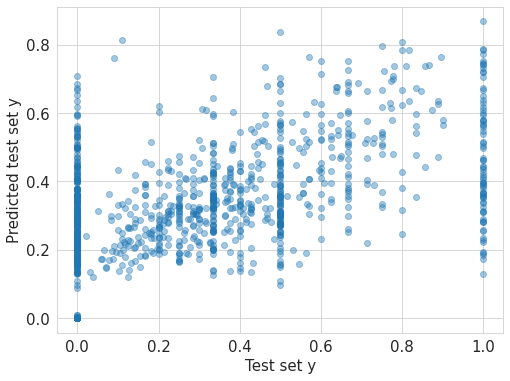

In [42]:
plt.figure(figsize = (8,6))

plt.plot(y_test, y_pred_rf, 'o', alpha = 0.4);

plt.xlabel('Test set y', fontsize = 15)
plt.ylabel('Predicted test set y', fontsize = 15)

plt.tick_params(labelsize = 15);

In [43]:
mean_squared_error(y_test, y_pred_rf, squared = False).round(3)

0.251

In [44]:
r_squared = model_rf.score(X, y)
print(r_squared)

0.6487793716168762


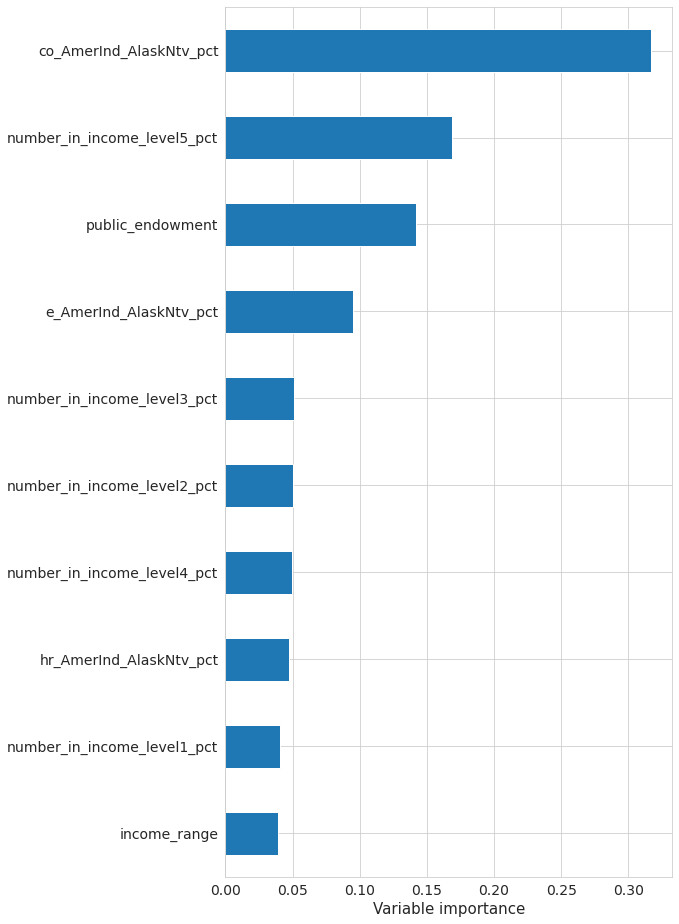

In [45]:
(pd.DataFrame(dict(cols=X_train.columns, imp=model_rf.feature_importances_)).
 sort_values(by = 'imp').
 plot('cols', 'imp', 'barh', legend = False, figsize = (8,16)))

plt.ylabel('')
plt.xlabel('Variable importance', fontsize = 15)

plt.tick_params(labelsize = 14);

## Asian Visualizations

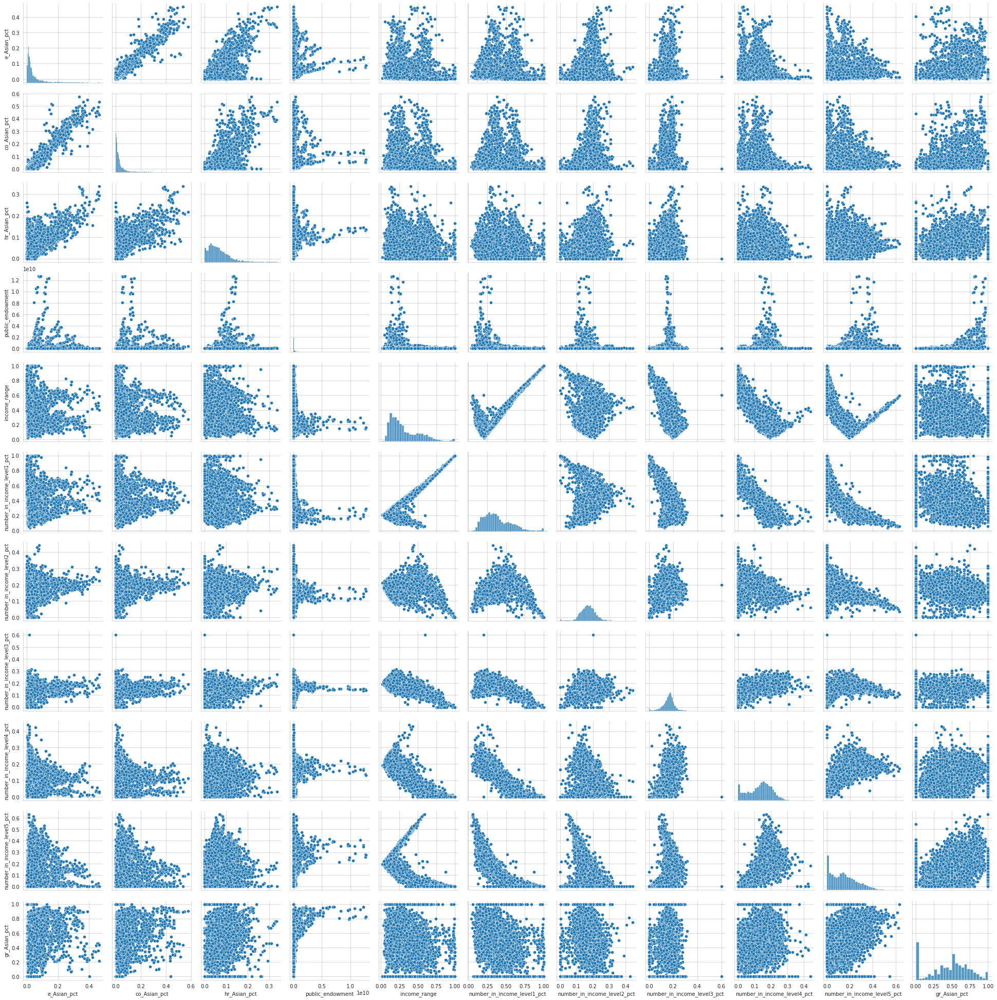

In [46]:
sns.pairplot(df[['e_Asian_pct', 'co_Asian_pct', 'hr_Asian_pct', 'public_endowment', 'income_range', 
                 'number_in_income_level1_pct', 'number_in_income_level2_pct', 'number_in_income_level3_pct', 'number_in_income_level4_pct', 'number_in_income_level5_pct', 'gr_Asian_pct']])

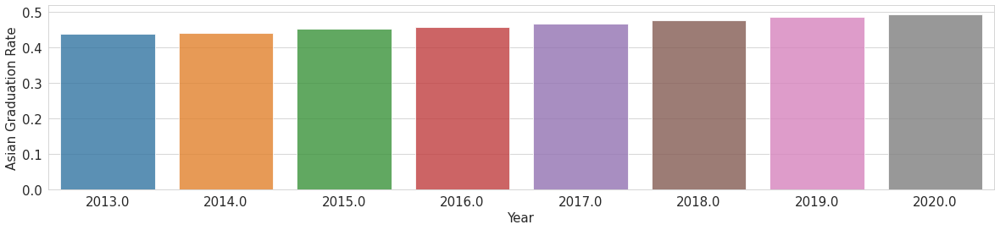

In [47]:
plt.figure(figsize = (20, 4))
df_barplot = df.groupby('year')[['year', 'gr_Asian_pct']].mean()
sns.barplot(data = df_barplot, x = 'year', y = 'gr_Asian_pct', alpha = 0.8)

plt.xlabel('Year', fontsize = 15)
plt.ylabel("Asian Graduation Rate", fontsize = 15)
plt.tick_params(labelsize = 15);

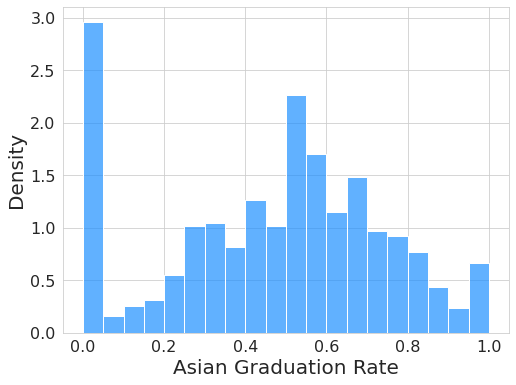

In [48]:
plt.figure(figsize = (8,6))

# Setup histogram plot
sns.histplot(data = df, x = 'gr_Asian_pct', bins = 20, color = 'dodgerblue', alpha = 0.7, stat = 'density')

# Label x and y axis
plt.xlabel('Asian Graduation Rate', fontsize = 20)
plt.ylabel('Density', fontsize = 20)

plt.tick_params(labelsize = 16)

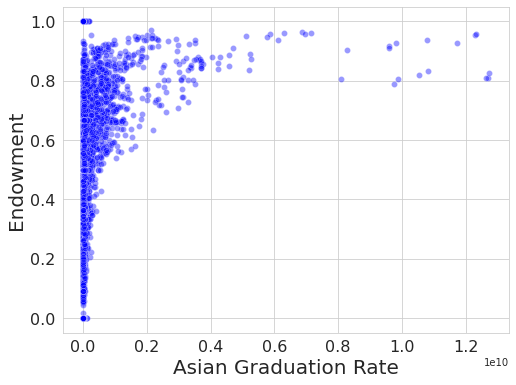

In [49]:
plt.figure(figsize = (8,6))

# Setup histogram plot
sns.scatterplot(data = df, x = 'public_endowment', y = 'gr_Asian_pct', color = 'blue', alpha = 0.4)

# Label x and y axis
plt.xlabel('Asian Graduation Rate', fontsize = 20)
plt.ylabel('Endowment', fontsize = 20)

plt.tick_params(labelsize = 16)

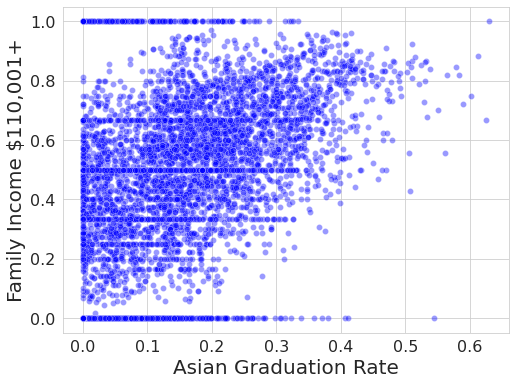

In [50]:
plt.figure(figsize = (8,6))

# Setup histogram plot
sns.scatterplot(data = df, x = 'number_in_income_level5_pct', y = 'gr_Asian_pct', color = 'blue', alpha = 0.4)

# Label x and y axis
plt.xlabel('Asian Graduation Rate', fontsize = 20)
plt.ylabel('Family Income $110,001+', fontsize = 20)

plt.tick_params(labelsize = 16)

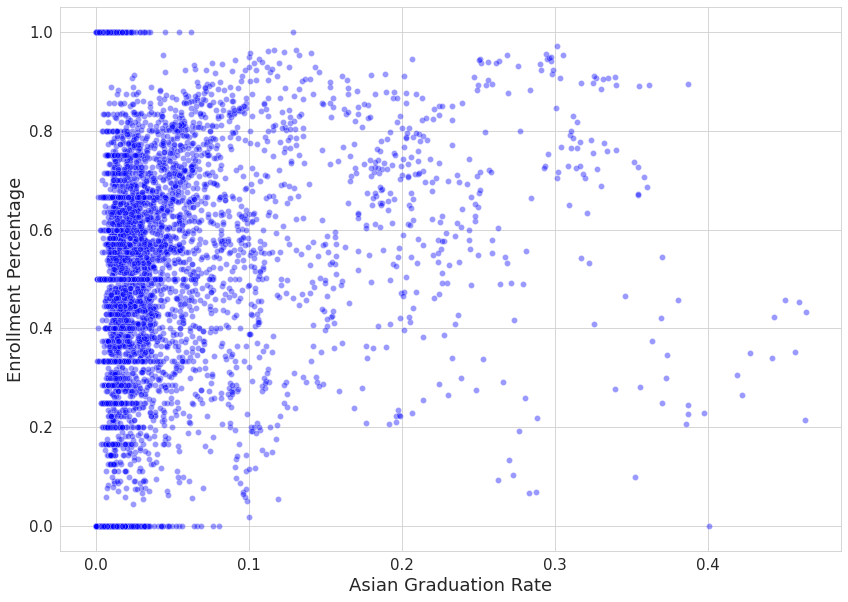

In [51]:
# Set figure size
plt.figure(figsize = (14, 10))

# Setup scatter plot for 
sns.scatterplot(data = df, x = 'e_Asian_pct', y = 'gr_Asian_pct', color = 'blue', alpha = 0.4)

# Label x and y axis
plt.xlabel('Asian Graduation Rate', fontsize = 18)
plt.ylabel('Enrollment Percentage', fontsize = 18)

plt.ticklabel_format(style='plain')
#plt.xlim(0.0, 1.0)
#plt.ylim(0.0, 1.0)

plt.tick_params(labelsize = 15);

## Asian Graduation Rate Modeling

In [52]:
df_clean = df.dropna()
X = df_clean[['e_Asian_pct', 'co_Asian_pct', 'hr_Asian_pct', 'public_endowment', 'income_range', 'number_in_income_level1_pct', 'number_in_income_level2_pct', 'number_in_income_level3_pct', 'number_in_income_level4_pct', 'number_in_income_level5_pct']]
y = df_clean['gr_Asian_pct']

In [53]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state = 1)

In [54]:
df_pred = pd.concat([X_test, y_test], axis = 1)

df_pred.head()

,e_Asian_pct,co_Asian_pct,hr_Asian_pct,public_endowment,income_range,number_in_income_level1_pct,number_in_income_level2_pct,number_in_income_level3_pct,number_in_income_level4_pct,number_in_income_level5_pct,gr_Asian_pct
3312,0.014471,0.012251,0.055814,61090095.0,0.146624,0.294304,0.204641,0.166667,0.186709,0.147679,0.583333
1932,0.031291,0.030687,0.052778,404522000.0,0.086842,0.160526,0.163158,0.184211,0.247368,0.244737,0.750000
3534,0.192464,0.250167,0.111178,44728060.0,0.313725,0.412565,0.223689,0.161665,0.103241,0.098840,0.497326
4376,0.130875,0.170897,0.087555,182002529.0,0.281174,0.383777,0.214891,0.167676,0.102603,0.131053,0.557858
211,0.019164,0.021111,0.020679,31634000.0,0.186851,0.311419,0.166090,0.202422,0.195502,0.124567,0.315789


## Asian Linear Regression

In [55]:
model = sm.OLS(y_train, sm.add_constant(X_train)).fit() 

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


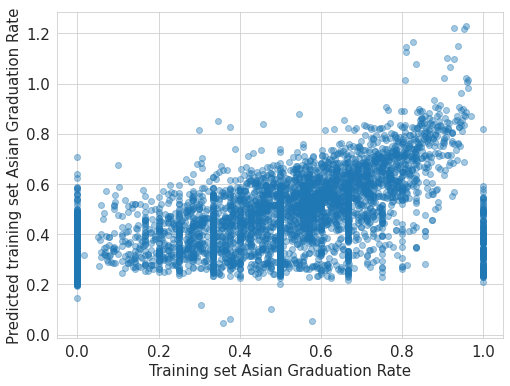

In [56]:
plt.figure(figsize = (8,6))

plt.plot(y_train, model.predict(sm.add_constant(X_train)), 'o', alpha = 0.4)

plt.xlabel('Training set Asian Graduation Rate', fontsize = 15)
plt.ylabel('Predicted training set Asian Graduation Rate', fontsize = 15)

plt.tick_params(labelsize = 15);

In [57]:
y_pred_lr = model.predict(sm.add_constant(X_test))

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


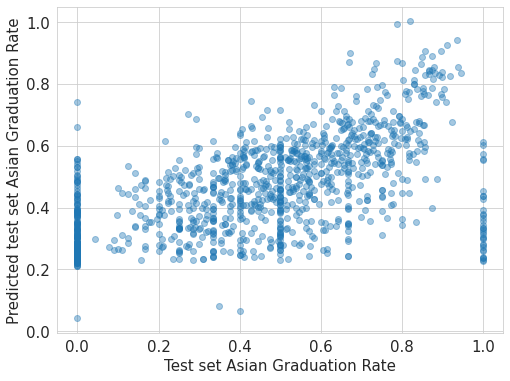

In [58]:
plt.figure(figsize = (8,6))

plt.plot(y_test, y_pred_lr, 'o', alpha = 0.4);

plt.xlabel('Test set Asian Graduation Rate', fontsize = 15)
plt.ylabel('Predicted test set Asian Graduation Rate', fontsize = 15)

plt.tick_params(labelsize = 15)

In [59]:
# Mean Squared Error
mean_squared_error(y_test, y_pred_lr, squared = False).round(3)

0.224

In [60]:
# Mean Absolute Error
mean_absolute_error(y_test, y_pred_lr).round(3)

0.171

In [61]:
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:           gr_Asian_pct   R-squared:                       0.335
Model:                            OLS   Adj. R-squared:                  0.333
Method:                 Least Squares   F-statistic:                     242.5
Date:                Thu, 08 Dec 2022   Prob (F-statistic):               0.00
Time:                        00:14:02   Log-Likelihood:                 354.66
No. Observations:                4348   AIC:                            -689.3
Df Residuals:                    4338   BIC:                            -625.6
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

## Asian Random Forest

In [62]:
model_rf = RandomForestRegressor(100, min_samples_leaf=5)

In [63]:
model_rf.fit(X_train, y_train)

RandomForestRegressor(min_samples_leaf=5)

In [64]:
y_pred_rf = model_rf.predict(X_test)

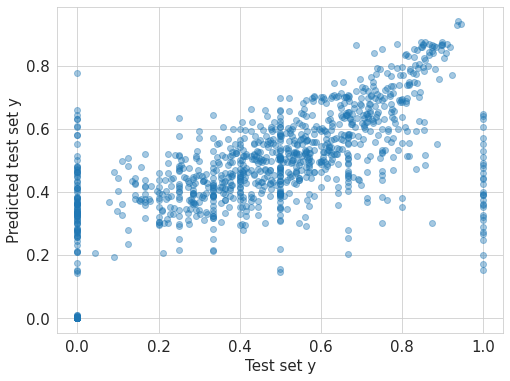

In [65]:
plt.figure(figsize = (8,6))

plt.plot(y_test, y_pred_rf, 'o', alpha = 0.4);

plt.xlabel('Test set y', fontsize = 15)
plt.ylabel('Predicted test set y', fontsize = 15)

plt.tick_params(labelsize = 15);

In [66]:
mean_squared_error(y_test, y_pred_rf, squared = False).round(3)

0.197

In [67]:
r_squared = model_rf.score(X, y)
print(r_squared)

0.7341600208886092


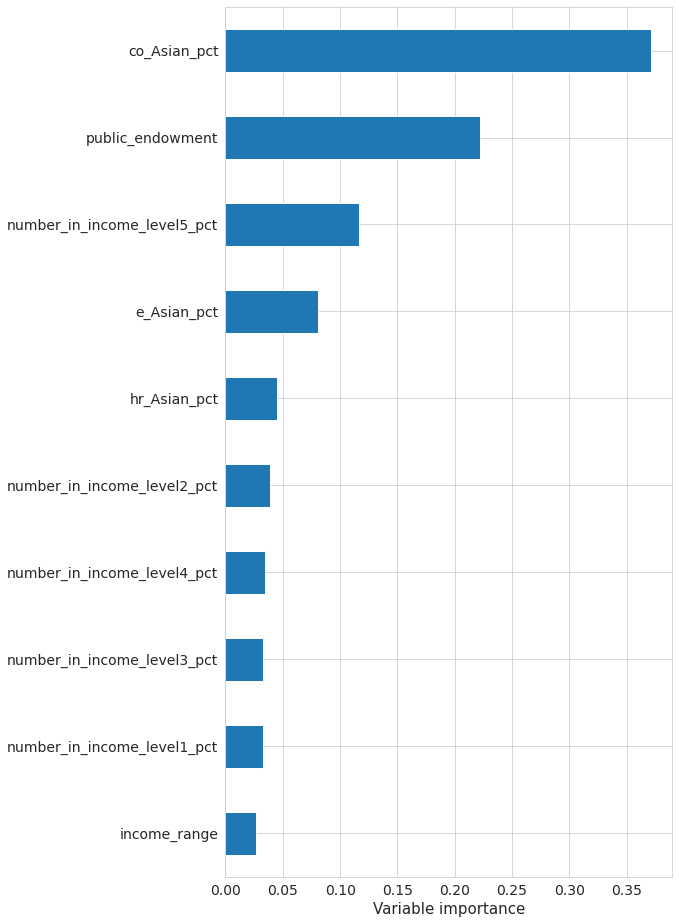

In [68]:
(pd.DataFrame(dict(cols=X_train.columns, imp=model_rf.feature_importances_)).
 sort_values(by = 'imp').
 plot('cols', 'imp', 'barh', legend = False, figsize = (8,16)))

plt.ylabel('')
plt.xlabel('Variable importance', fontsize = 15)

plt.tick_params(labelsize = 14);

## African American Visualizations

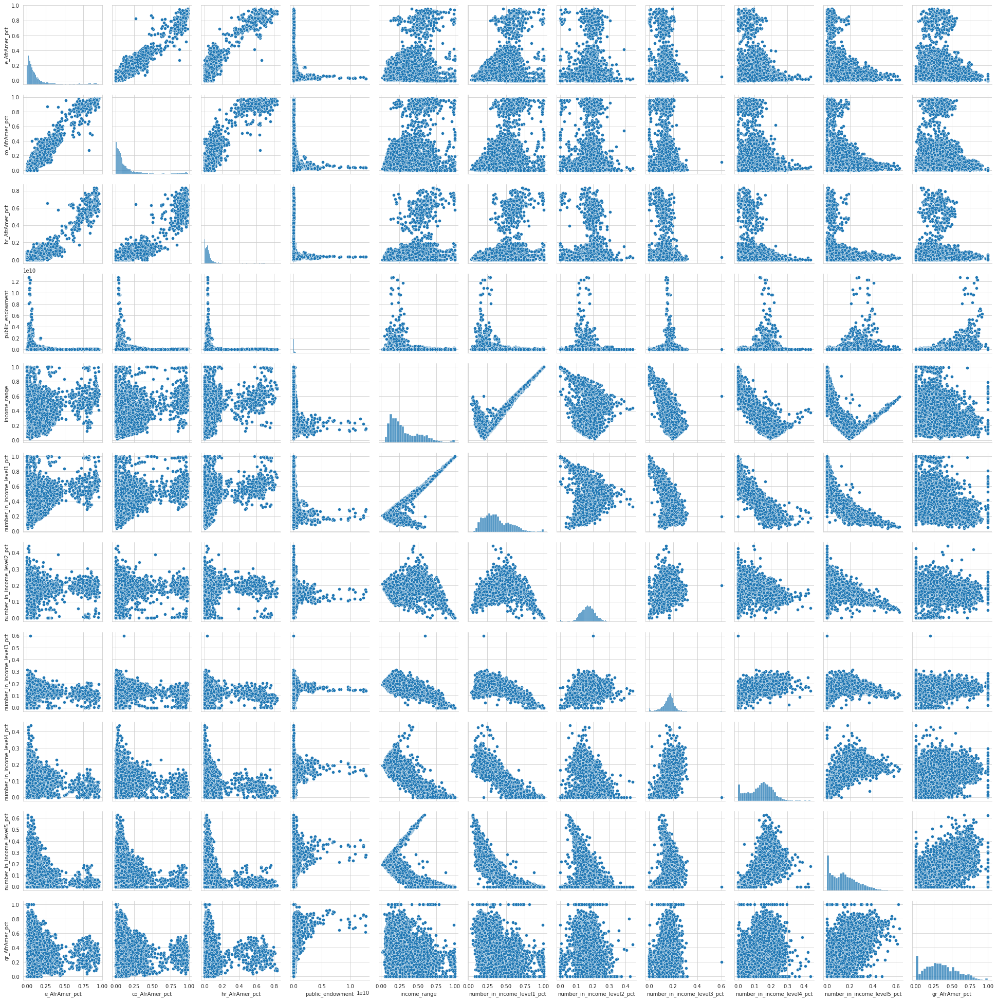

In [69]:
sns.pairplot(df[['e_AfrAmer_pct', 'co_AfrAmer_pct', 'hr_AfrAmer_pct', 'public_endowment', 'income_range', 
                 'number_in_income_level1_pct', 'number_in_income_level2_pct', 'number_in_income_level3_pct', 'number_in_income_level4_pct', 'number_in_income_level5_pct', 'gr_AfrAmer_pct']])

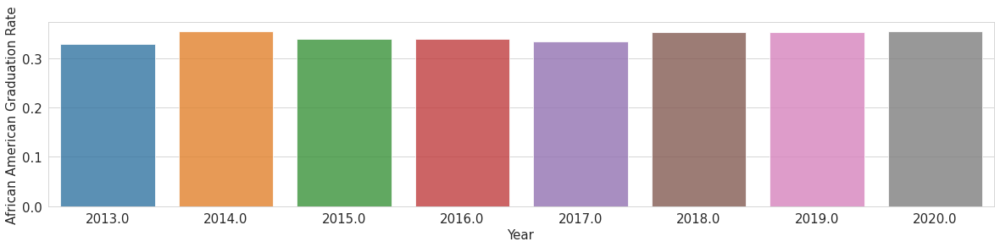

In [70]:
plt.figure(figsize = (20, 4))
df_barplot = df.groupby('year')[['year', 'gr_AfrAmer_pct']].mean()
sns.barplot(data = df_barplot, x = 'year', y = 'gr_AfrAmer_pct', alpha = 0.8)

plt.xlabel('Year', fontsize = 15)
plt.ylabel("African American Graduation Rate", fontsize = 15)
plt.tick_params(labelsize = 15);

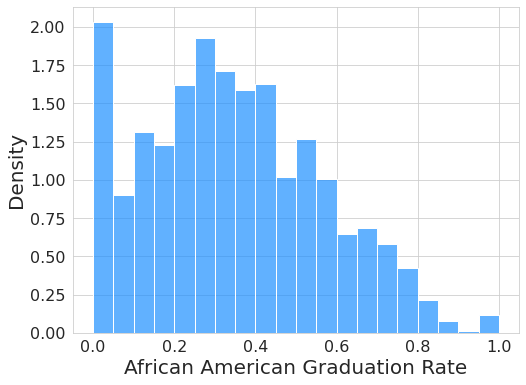

In [71]:
plt.figure(figsize = (8,6))

# Setup histogram plot
sns.histplot(data = df, x = 'gr_AfrAmer_pct', bins = 20, color = 'dodgerblue', alpha = 0.7, stat = 'density')

# Label x and y axis
plt.xlabel('African American Graduation Rate', fontsize = 20)
plt.ylabel('Density', fontsize = 20)

plt.tick_params(labelsize = 16)

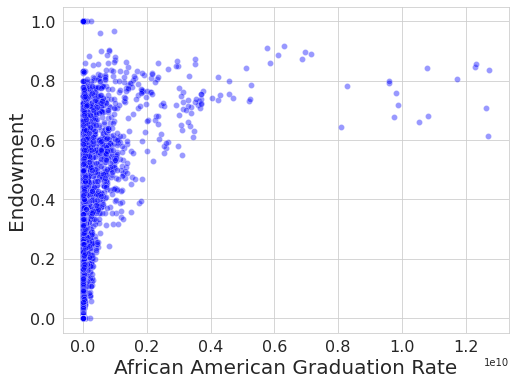

In [72]:
plt.figure(figsize = (8,6))

# Setup histogram plot
sns.scatterplot(data = df, x = 'public_endowment', y = 'gr_AfrAmer_pct', color = 'blue', alpha = 0.4)

# Label x and y axis
plt.xlabel('African American Graduation Rate', fontsize = 20)
plt.ylabel('Endowment', fontsize = 20)

plt.tick_params(labelsize = 16)

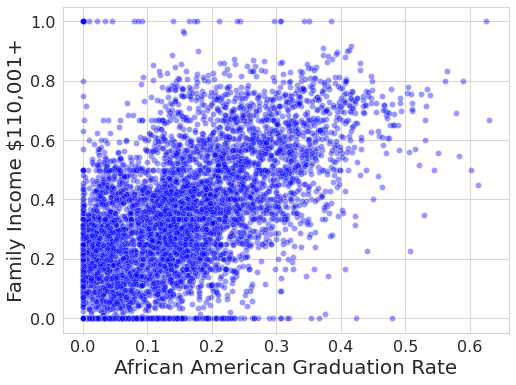

In [73]:
plt.figure(figsize = (8,6))

# Setup histogram plot
sns.scatterplot(data = df, x = 'number_in_income_level5_pct', y = 'gr_AfrAmer_pct', color = 'blue', alpha = 0.4)

# Label x and y axis
plt.xlabel('African American Graduation Rate', fontsize = 20)
plt.ylabel('Family Income $110,001+', fontsize = 20)

plt.tick_params(labelsize = 16)

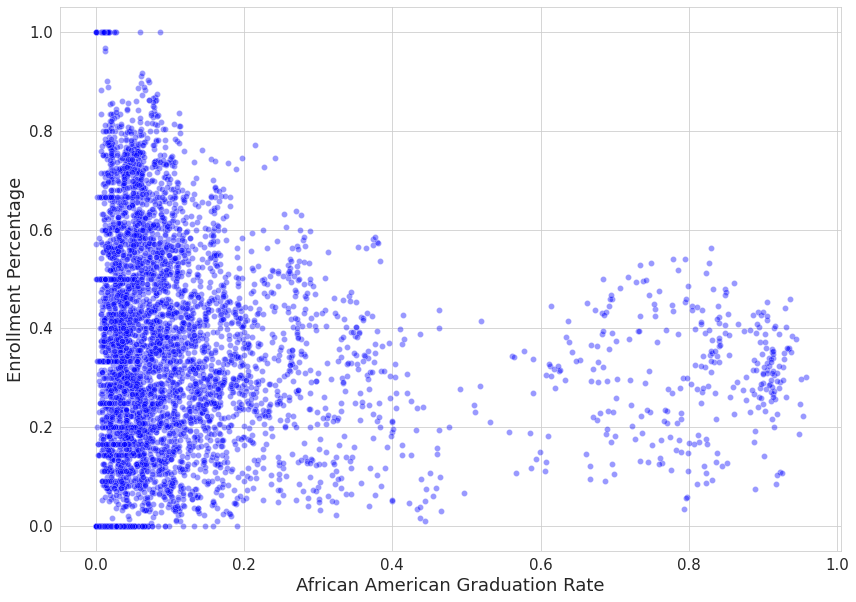

In [74]:
# Set figure size
plt.figure(figsize = (14, 10))

# Setup scatter plot for 
sns.scatterplot(data = df, x = 'e_AfrAmer_pct', y = 'gr_AfrAmer_pct', color = 'blue', alpha = 0.4)

# Label x and y axis
plt.xlabel('African American Graduation Rate', fontsize = 18)
plt.ylabel('Enrollment Percentage', fontsize = 18)

plt.ticklabel_format(style='plain')
#plt.xlim(0.0, 1.0)
#plt.ylim(0.0, 1.0)

plt.tick_params(labelsize = 15);

## African American Graduation Rate Modeling

In [75]:
df_clean = df.dropna()
X = df_clean[['e_AfrAmer_pct', 'co_AfrAmer_pct', 'hr_AfrAmer_pct', 'public_endowment', 'income_range', 'number_in_income_level1_pct', 'number_in_income_level2_pct', 'number_in_income_level3_pct', 'number_in_income_level4_pct', 'number_in_income_level5_pct']]
y = df_clean['gr_AfrAmer_pct']

In [76]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state = 1)

In [77]:
df_pred = pd.concat([X_test, y_test], axis = 1)

df_pred.head()

,e_AfrAmer_pct,co_AfrAmer_pct,hr_AfrAmer_pct,public_endowment,income_range,number_in_income_level1_pct,number_in_income_level2_pct,number_in_income_level3_pct,number_in_income_level4_pct,number_in_income_level5_pct,gr_AfrAmer_pct
3312,0.040842,0.046452,0.024806,61090095.0,0.146624,0.294304,0.204641,0.166667,0.186709,0.147679,0.340659
1932,0.014280,0.021481,0.016667,404522000.0,0.086842,0.160526,0.163158,0.184211,0.247368,0.244737,0.714286
3534,0.057990,0.067559,0.047734,44728060.0,0.313725,0.412565,0.223689,0.161665,0.103241,0.098840,0.420792
4376,0.376530,0.379280,0.164097,182002529.0,0.281174,0.383777,0.214891,0.167676,0.102603,0.131053,0.585214
211,0.024655,0.023333,0.007386,31634000.0,0.186851,0.311419,0.166090,0.202422,0.195502,0.124567,0.238095


## African American Linear Regression

In [78]:
model = sm.OLS(y_train, sm.add_constant(X_train)).fit() 

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


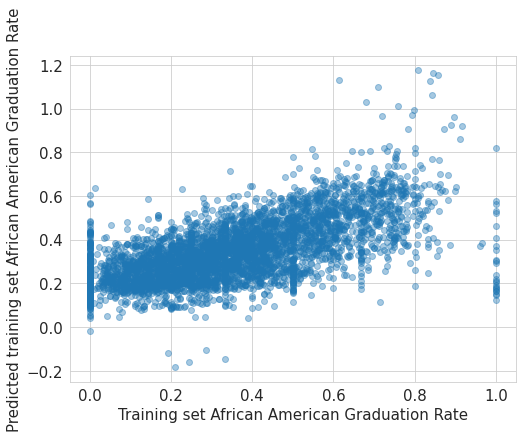

In [79]:
plt.figure(figsize = (8,6))

plt.plot(y_train, model.predict(sm.add_constant(X_train)), 'o', alpha = 0.4)

plt.xlabel('Training set African American Graduation Rate', fontsize = 15)
plt.ylabel('Predicted training set African American Graduation Rate', fontsize = 15)

plt.tick_params(labelsize = 15);

In [80]:
y_pred_lr = model.predict(sm.add_constant(X_test))

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


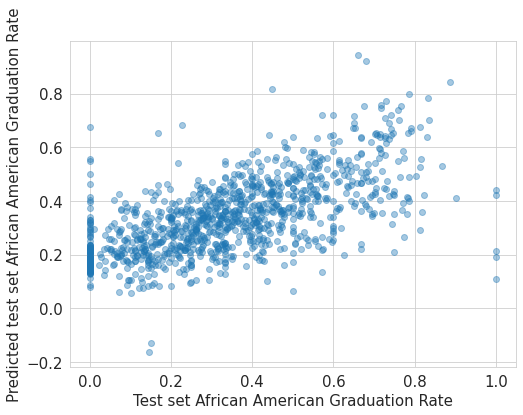

In [81]:
plt.figure(figsize = (8,6))

plt.plot(y_test, y_pred_lr, 'o', alpha = 0.4);

plt.xlabel('Test set African American Graduation Rate', fontsize = 15)
plt.ylabel('Predicted test set African American Graduation Rate', fontsize = 15)

plt.tick_params(labelsize = 15)

In [82]:
# Mean Squared Error
mean_squared_error(y_test, y_pred_lr, squared = False).round(3)

0.168

In [83]:
# Mean Absolute Error
mean_absolute_error(y_test, y_pred_lr).round(3)

0.128

In [84]:
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:         gr_AfrAmer_pct   R-squared:                       0.430
Model:                            OLS   Adj. R-squared:                  0.429
Method:                 Least Squares   F-statistic:                     363.5
Date:                Thu, 08 Dec 2022   Prob (F-statistic):               0.00
Time:                        00:15:25   Log-Likelihood:                 1638.6
No. Observations:                4348   AIC:                            -3257.
Df Residuals:                    4338   BIC:                            -3194.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

## African American Random Forest

In [85]:
model_rf = RandomForestRegressor(100, min_samples_leaf=5)

In [86]:
model_rf.fit(X_train, y_train)

RandomForestRegressor(min_samples_leaf=5)

In [87]:
y_pred_rf = model_rf.predict(X_test)

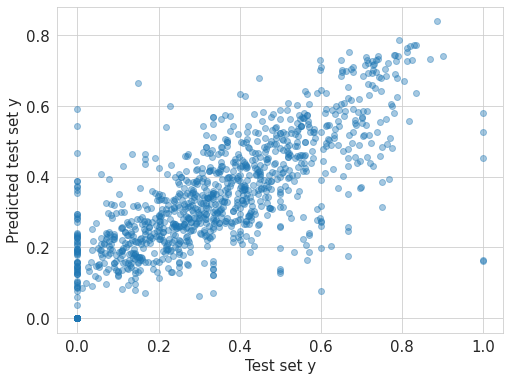

In [88]:
plt.figure(figsize = (8,6))

plt.plot(y_test, y_pred_rf, 'o', alpha = 0.4);

plt.xlabel('Test set y', fontsize = 15)
plt.ylabel('Predicted test set y', fontsize = 15)

plt.tick_params(labelsize = 15);

In [89]:
mean_squared_error(y_test, y_pred_rf, squared = False).round(3)

0.139

In [90]:
r_squared = model_rf.score(X, y)
print(r_squared)

0.7877612704673163


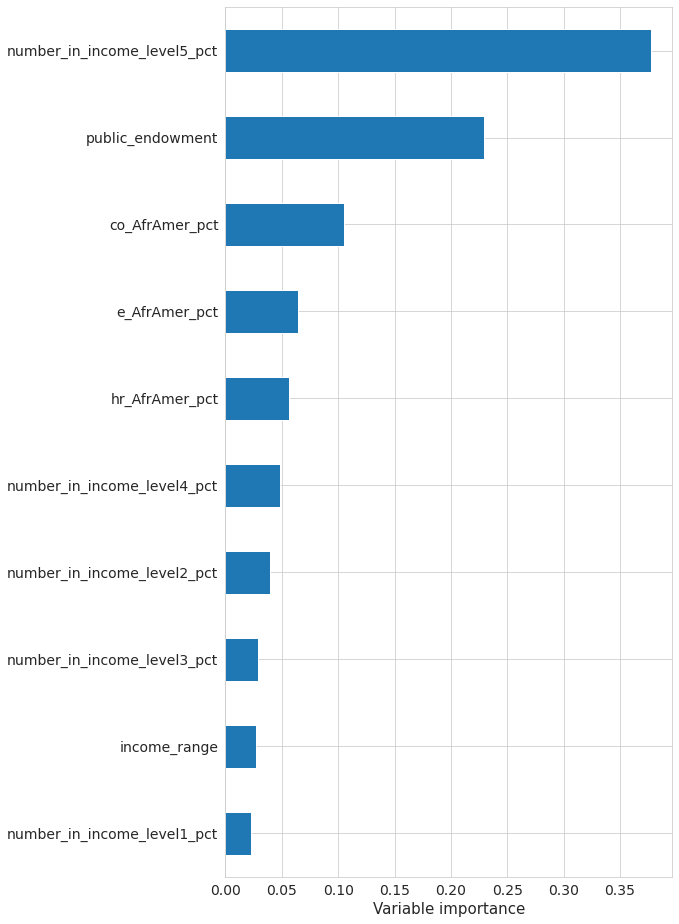

In [91]:
(pd.DataFrame(dict(cols=X_train.columns, imp=model_rf.feature_importances_)).
 sort_values(by = 'imp').
 plot('cols', 'imp', 'barh', legend = False, figsize = (8,16)))

plt.ylabel('')
plt.xlabel('Variable importance', fontsize = 15)

plt.tick_params(labelsize = 14);

## Hispanic Visualizations

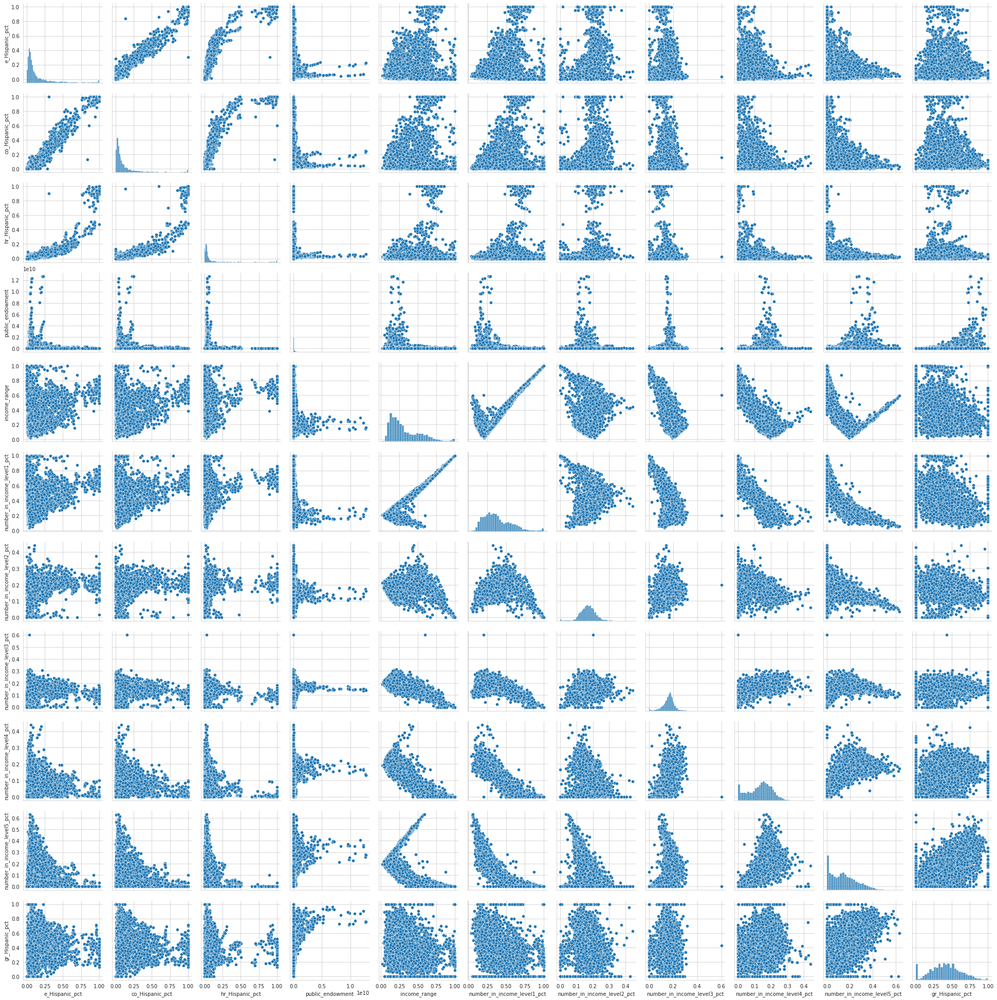

In [92]:
sns.pairplot(df[['e_Hispanic_pct', 'co_Hispanic_pct', 'hr_Hispanic_pct', 'public_endowment', 'income_range', 
                 'number_in_income_level1_pct', 'number_in_income_level2_pct', 'number_in_income_level3_pct', 'number_in_income_level4_pct', 'number_in_income_level5_pct', 'gr_Hispanic_pct']])

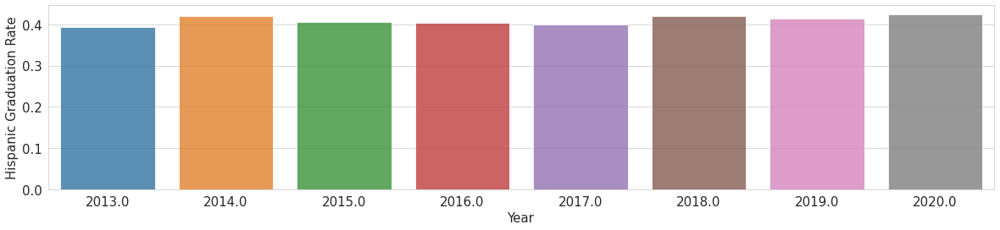

In [93]:
plt.figure(figsize = (20, 4))
df_barplot = df.groupby('year')[['year', 'gr_Hispanic_pct']].mean()
sns.barplot(data = df_barplot, x = 'year', y = 'gr_Hispanic_pct', alpha = 0.8)

plt.xlabel('Year', fontsize = 15)
plt.ylabel("Hispanic Graduation Rate", fontsize = 15)
plt.tick_params(labelsize = 15);

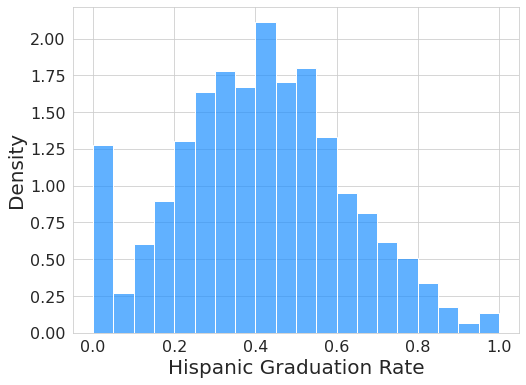

In [94]:
plt.figure(figsize = (8,6))

# Setup histogram plot
sns.histplot(data = df, x = 'gr_Hispanic_pct', bins = 20, color = 'dodgerblue', alpha = 0.7, stat = 'density')

# Label x and y axis
plt.xlabel('Hispanic Graduation Rate', fontsize = 20)
plt.ylabel('Density', fontsize = 20)

plt.tick_params(labelsize = 16)

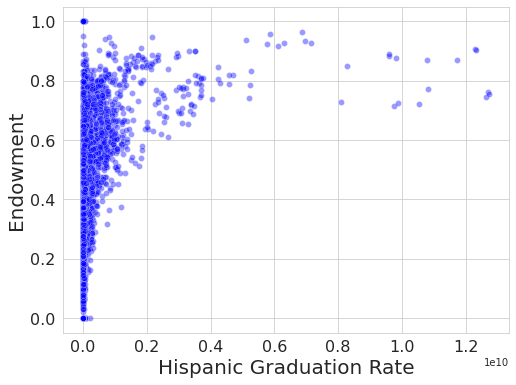

In [95]:
plt.figure(figsize = (8,6))

# Setup histogram plot
sns.scatterplot(data = df, x = 'public_endowment', y = 'gr_Hispanic_pct', color = 'blue', alpha = 0.4)

# Label x and y axis
plt.xlabel('Hispanic Graduation Rate', fontsize = 20)
plt.ylabel('Endowment', fontsize = 20)

plt.tick_params(labelsize = 16)

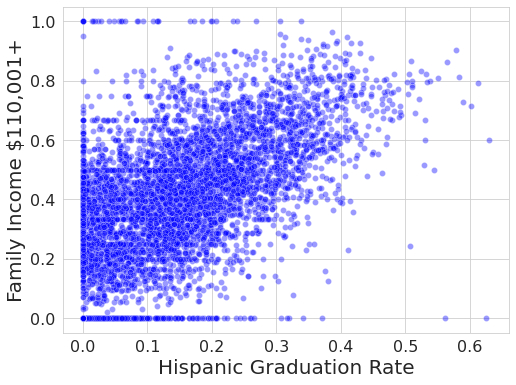

In [96]:
plt.figure(figsize = (8,6))

# Setup histogram plot
sns.scatterplot(data = df, x = 'number_in_income_level5_pct', y = 'gr_Hispanic_pct', color = 'blue', alpha = 0.4)

# Label x and y axis
plt.xlabel('Hispanic Graduation Rate', fontsize = 20)
plt.ylabel('Family Income $110,001+', fontsize = 20)

plt.tick_params(labelsize = 16)

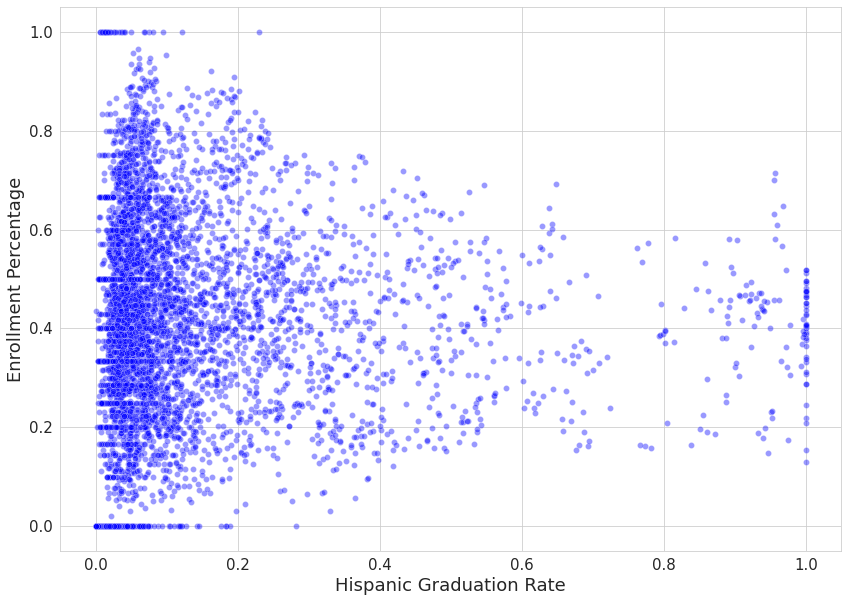

In [97]:
# Set figure size
plt.figure(figsize = (14, 10))

# Setup scatter plot for 
sns.scatterplot(data = df, x = 'e_Hispanic_pct', y = 'gr_Hispanic_pct', color = 'blue', alpha = 0.4)

# Label x and y axis
plt.xlabel('Hispanic Graduation Rate', fontsize = 18)
plt.ylabel('Enrollment Percentage', fontsize = 18)

plt.ticklabel_format(style='plain')
#plt.xlim(0.0, 1.0)
#plt.ylim(0.0, 1.0)

plt.tick_params(labelsize = 15);

## Hispanic Graduation Rate Modeling

In [98]:
df_clean = df.dropna()
X = df_clean[['e_Hispanic_pct', 'co_Hispanic_pct', 'hr_Hispanic_pct', 'public_endowment', 'income_range', 'number_in_income_level1_pct', 'number_in_income_level2_pct', 'number_in_income_level3_pct', 'number_in_income_level4_pct', 'number_in_income_level5_pct']]
y = df_clean['gr_Hispanic_pct']

In [99]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state = 1)

In [100]:
df_pred = pd.concat([X_test, y_test], axis = 1)

df_pred.head()

,e_Hispanic_pct,co_Hispanic_pct,hr_Hispanic_pct,public_endowment,income_range,number_in_income_level1_pct,number_in_income_level2_pct,number_in_income_level3_pct,number_in_income_level4_pct,number_in_income_level5_pct,gr_Hispanic_pct
3312,0.029798,0.026034,0.013953,61090095.0,0.146624,0.294304,0.204641,0.166667,0.186709,0.147679,0.313725
1932,0.039953,0.032221,0.026389,404522000.0,0.086842,0.160526,0.163158,0.184211,0.247368,0.244737,0.785714
3534,0.310106,0.316388,0.071903,44728060.0,0.313725,0.412565,0.223689,0.161665,0.103241,0.098840,0.541226
4376,0.109557,0.110980,0.032489,182002529.0,0.281174,0.383777,0.214891,0.167676,0.102603,0.131053,0.582447
211,0.016250,0.011111,0.010340,31634000.0,0.186851,0.311419,0.166090,0.202422,0.195502,0.124567,0.100000


## Hispanic Linear Regression

In [101]:
model = sm.OLS(y_train, sm.add_constant(X_train)).fit() 

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


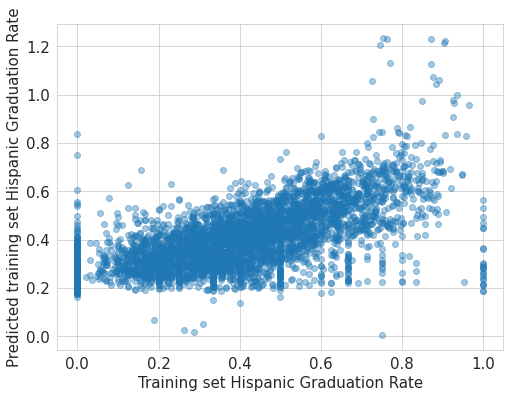

In [102]:
plt.figure(figsize = (8,6))

plt.plot(y_train, model.predict(sm.add_constant(X_train)), 'o', alpha = 0.4)

plt.xlabel('Training set Hispanic Graduation Rate', fontsize = 15)
plt.ylabel('Predicted training set Hispanic Graduation Rate', fontsize = 15)

plt.tick_params(labelsize = 15);

In [103]:
y_pred_lr = model.predict(sm.add_constant(X_test))

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


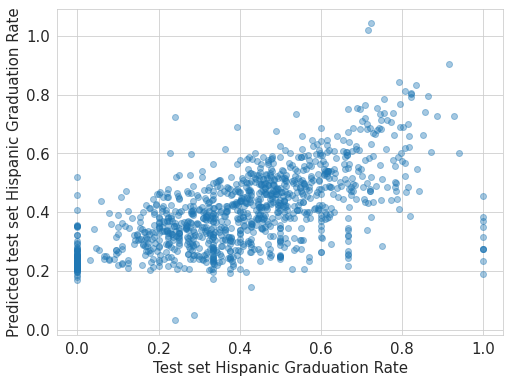

In [104]:
plt.figure(figsize = (8,6))

plt.plot(y_test, y_pred_lr, 'o', alpha = 0.4);

plt.xlabel('Test set Hispanic Graduation Rate', fontsize = 15)
plt.ylabel('Predicted test set Hispanic Graduation Rate', fontsize = 15)

plt.tick_params(labelsize = 15)

In [105]:
# Mean Squared Error
mean_squared_error(y_test, y_pred_lr, squared = False).round(3)

0.165

In [106]:
# Mean Absolute Error
mean_absolute_error(y_test, y_pred_lr).round(3)

0.125

In [107]:
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:        gr_Hispanic_pct   R-squared:                       0.399
Model:                            OLS   Adj. R-squared:                  0.398
Method:                 Least Squares   F-statistic:                     320.0
Date:                Thu, 08 Dec 2022   Prob (F-statistic):               0.00
Time:                        00:16:51   Log-Likelihood:                 1696.7
No. Observations:                4348   AIC:                            -3373.
Df Residuals:                    4338   BIC:                            -3310.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

## Hispanic Random Forest

In [108]:
model_rf = RandomForestRegressor(100, min_samples_leaf=5)

In [109]:
model_rf.fit(X_train, y_train)

RandomForestRegressor(min_samples_leaf=5)

In [110]:
y_pred_rf = model_rf.predict(X_test)

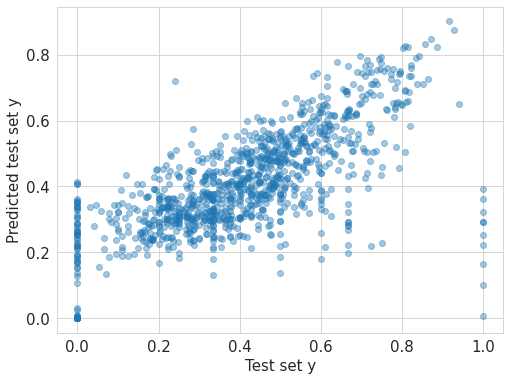

In [111]:
plt.figure(figsize = (8,6))

plt.plot(y_test, y_pred_rf, 'o', alpha = 0.4);

plt.xlabel('Test set y', fontsize = 15)
plt.ylabel('Predicted test set y', fontsize = 15)

plt.tick_params(labelsize = 15);

In [112]:
mean_squared_error(y_test, y_pred_rf, squared = False).round(3)

0.149

In [113]:
r_squared = model_rf.score(X, y)
print(r_squared)

0.7437364033775027


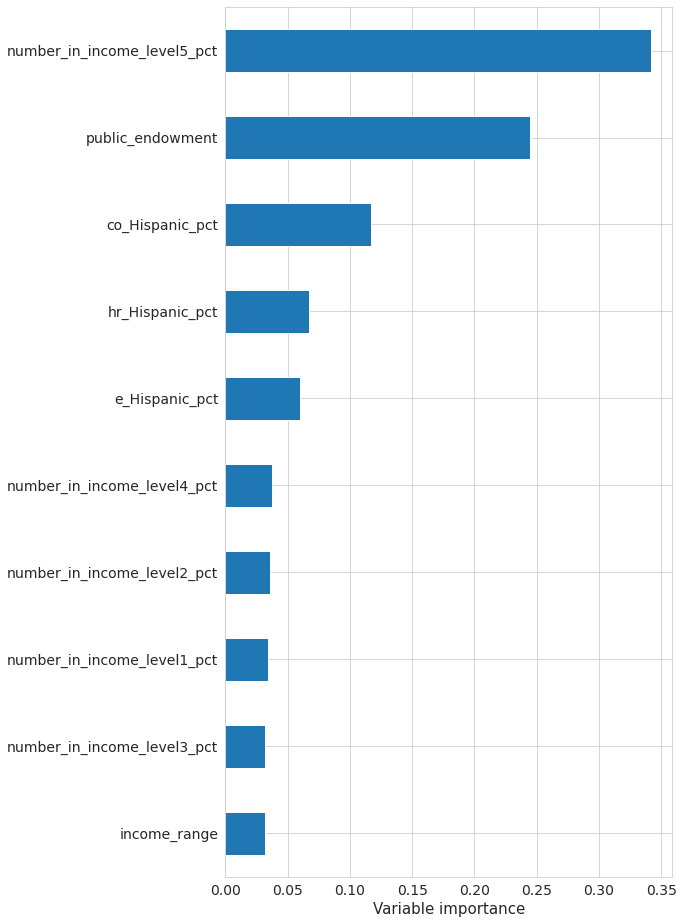

In [114]:
(pd.DataFrame(dict(cols=X_train.columns, imp=model_rf.feature_importances_)).
 sort_values(by = 'imp').
 plot('cols', 'imp', 'barh', legend = False, figsize = (8,16)))

plt.ylabel('')
plt.xlabel('Variable importance', fontsize = 15)

plt.tick_params(labelsize = 14);

## Native Hawaiian or Other Pacific Islander Visualizations

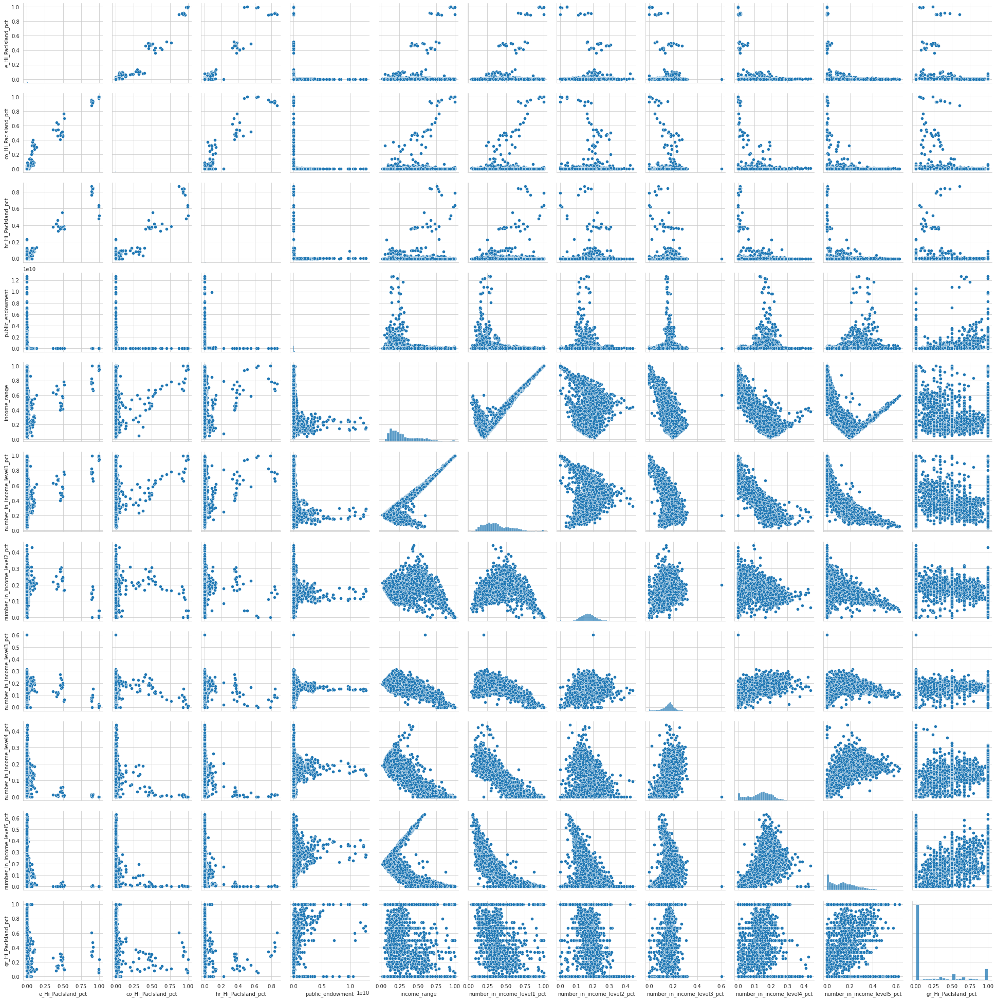

In [115]:
sns.pairplot(df[['e_Hi_PacIsland_pct', 'co_Hi_PacIsland_pct', 'hr_Hi_PacIsland_pct', 'public_endowment', 'income_range', 
                 'number_in_income_level1_pct', 'number_in_income_level2_pct', 'number_in_income_level3_pct', 'number_in_income_level4_pct', 'number_in_income_level5_pct', 'gr_Hi_PacIsland_pct']])

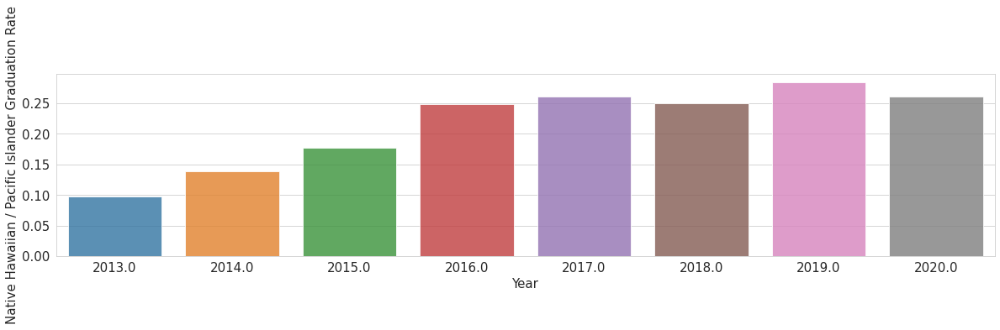

In [116]:
plt.figure(figsize = (20, 4))
df_barplot = df.groupby('year')[['year', 'gr_Hi_PacIsland_pct']].mean()
sns.barplot(data = df_barplot, x = 'year', y = 'gr_Hi_PacIsland_pct', alpha = 0.8)

plt.xlabel('Year', fontsize = 15)
plt.ylabel("Native Hawaiian / Pacific Islander Graduation Rate", fontsize = 15)
plt.tick_params(labelsize = 15);

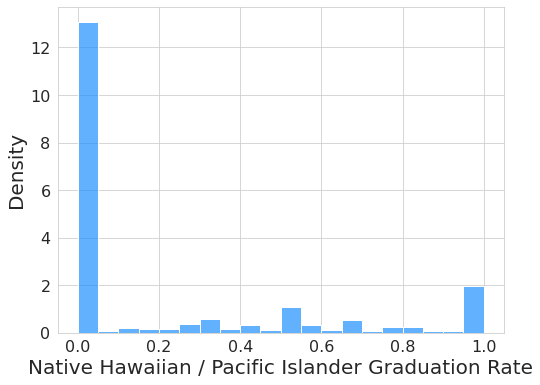

In [117]:
plt.figure(figsize = (8,6))

# Setup histogram plot
sns.histplot(data = df, x = 'gr_Hi_PacIsland_pct', bins = 20, color = 'dodgerblue', alpha = 0.7, stat = 'density')

# Label x and y axis
plt.xlabel('Native Hawaiian / Pacific Islander Graduation Rate', fontsize = 20)
plt.ylabel('Density', fontsize = 20)

plt.tick_params(labelsize = 16)

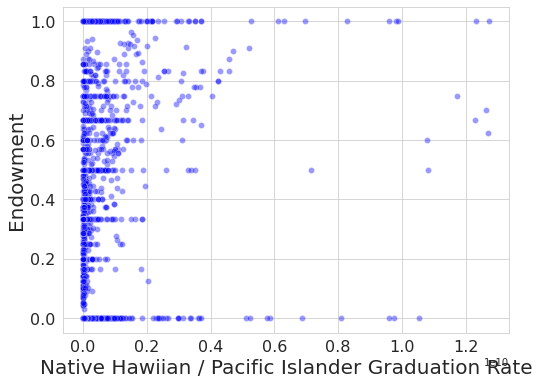

In [118]:
plt.figure(figsize = (8,6))

# Setup histogram plot
sns.scatterplot(data = df, x = 'public_endowment', y = 'gr_Hi_PacIsland_pct', color = 'blue', alpha = 0.4)

# Label x and y axis
plt.xlabel('Native Hawiian / Pacific Islander Graduation Rate', fontsize = 20)
plt.ylabel('Endowment', fontsize = 20)

plt.tick_params(labelsize = 16)

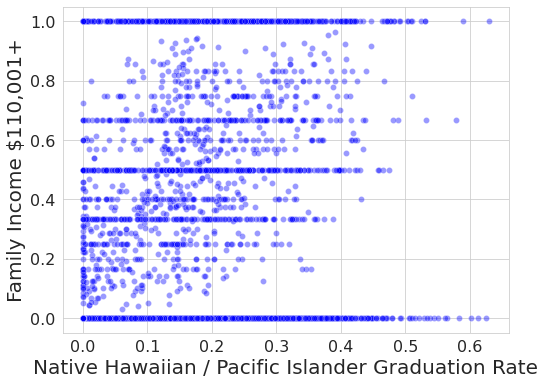

In [119]:
plt.figure(figsize = (8,6))

# Setup histogram plot
sns.scatterplot(data = df, x = 'number_in_income_level5_pct', y = 'gr_Hi_PacIsland_pct', color = 'blue', alpha = 0.4)

# Label x and y axis
plt.xlabel('Native Hawaiian / Pacific Islander Graduation Rate', fontsize = 20)
plt.ylabel('Family Income $110,001+', fontsize = 20)

plt.tick_params(labelsize = 16)

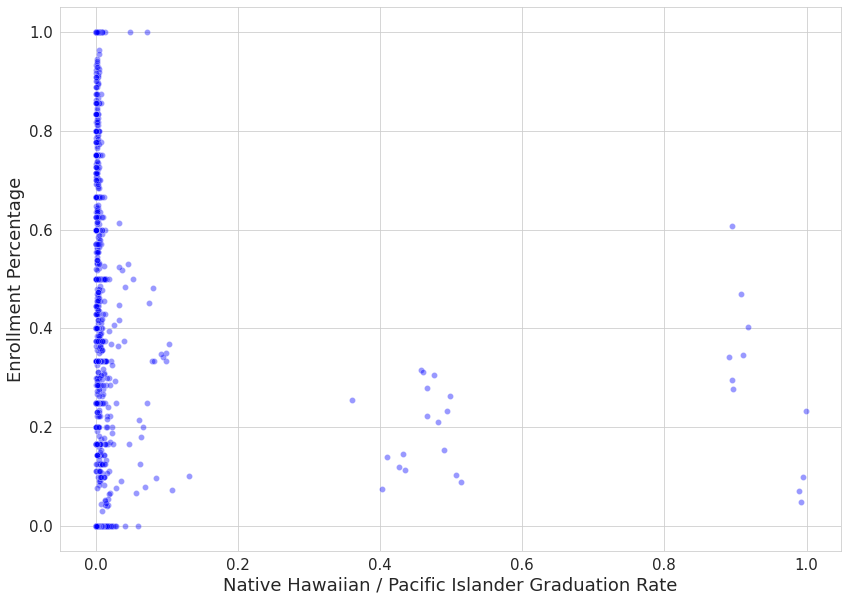

In [120]:
# Set figure size
plt.figure(figsize = (14, 10))

# Setup scatter plot for 
sns.scatterplot(data = df, x = 'e_Hi_PacIsland_pct', y = 'gr_Hi_PacIsland_pct', color = 'blue', alpha = 0.4)

# Label x and y axis
plt.xlabel('Native Hawaiian / Pacific Islander Graduation Rate', fontsize = 18)
plt.ylabel('Enrollment Percentage', fontsize = 18)

plt.ticklabel_format(style='plain')
#plt.xlim(0.0, 1.0)
#plt.ylim(0.0, 1.0)

plt.tick_params(labelsize = 15);

## Native Hawaiian or Other Pacific Islander Graduation Rate Modeling

In [121]:
df_clean = df.dropna()
X = df_clean[['e_Hi_PacIsland_pct', 'co_Hi_PacIsland_pct', 'hr_Hi_PacIsland_pct', 'public_endowment', 'income_range', 'number_in_income_level1_pct', 'number_in_income_level2_pct', 'number_in_income_level3_pct', 'number_in_income_level4_pct', 'number_in_income_level5_pct']]
y = df_clean['gr_Hi_PacIsland_pct']

In [122]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state = 1)

In [123]:
df_pred = pd.concat([X_test, y_test], axis = 1)

df_pred.head()

,e_Hi_PacIsland_pct,co_Hi_PacIsland_pct,hr_Hi_PacIsland_pct,public_endowment,income_range,number_in_income_level1_pct,number_in_income_level2_pct,number_in_income_level3_pct,number_in_income_level4_pct,number_in_income_level5_pct,gr_Hi_PacIsland_pct
3312,0.000381,0.000000,0.003101,61090095.0,0.146624,0.294304,0.204641,0.166667,0.186709,0.147679,0.000000
1932,0.000312,0.000000,0.000694,404522000.0,0.086842,0.160526,0.163158,0.184211,0.247368,0.244737,0.000000
3534,0.006896,0.012040,0.000604,44728060.0,0.313725,0.412565,0.223689,0.161665,0.103241,0.098840,0.388889
4376,0.000485,0.000000,0.000000,182002529.0,0.281174,0.383777,0.214891,0.167676,0.102603,0.131053,0.000000
211,0.000784,0.001111,0.000000,31634000.0,0.186851,0.311419,0.166090,0.202422,0.195502,0.124567,0.000000


## Native Hawaiian or Other Pacific Islander Linear Regression

In [124]:
model = sm.OLS(y_train, sm.add_constant(X_train)).fit() 

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


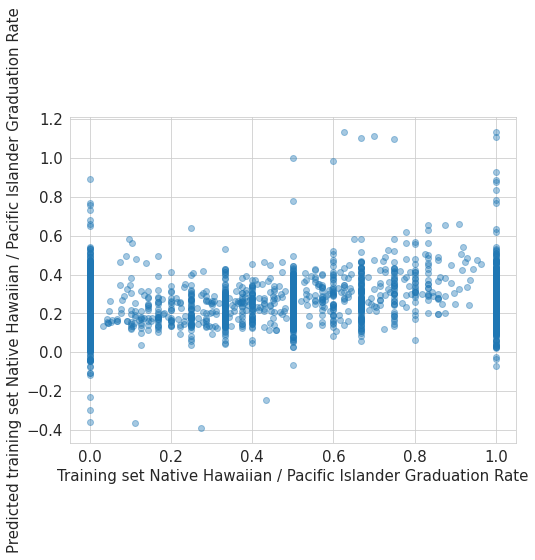

In [125]:
plt.figure(figsize = (8,6))

plt.plot(y_train, model.predict(sm.add_constant(X_train)), 'o', alpha = 0.4)

plt.xlabel('Training set Native Hawaiian / Pacific Islander Graduation Rate', fontsize = 15)
plt.ylabel('Predicted training set Native Hawaiian / Pacific Islander Graduation Rate', fontsize = 15)

plt.tick_params(labelsize = 15);

In [126]:
y_pred_lr = model.predict(sm.add_constant(X_test))

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


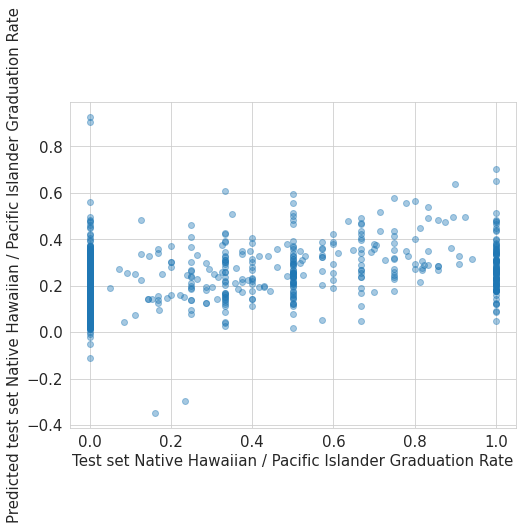

In [127]:
plt.figure(figsize = (8,6))

plt.plot(y_test, y_pred_lr, 'o', alpha = 0.4);

plt.xlabel('Test set Native Hawaiian / Pacific Islander Graduation Rate', fontsize = 15)
plt.ylabel('Predicted test set Native Hawaiian / Pacific Islander Graduation Rate', fontsize = 15)

plt.tick_params(labelsize = 15)

In [128]:
# Mean Squared Error
mean_squared_error(y_test, y_pred_lr, squared = False).round(3)

0.307

In [129]:
# Mean Absolute Error
mean_absolute_error(y_test, y_pred_lr).round(3)

0.245

In [130]:
print(model.summary())

                             OLS Regression Results                            
Dep. Variable:     gr_Hi_PacIsland_pct   R-squared:                       0.113
Model:                             OLS   Adj. R-squared:                  0.111
Method:                  Least Squares   F-statistic:                     61.27
Date:                 Thu, 08 Dec 2022   Prob (F-statistic):          3.80e-106
Time:                         00:19:01   Log-Likelihood:                -1307.9
No. Observations:                 4348   AIC:                             2636.
Df Residuals:                     4338   BIC:                             2699.
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const   

## Native Hawaiian or Other Pacific Islander Random Forest

In [131]:
model_rf = RandomForestRegressor(100, min_samples_leaf=5)

In [132]:
model_rf.fit(X_train, y_train)

RandomForestRegressor(min_samples_leaf=5)

In [133]:
y_pred_rf = model_rf.predict(X_test)

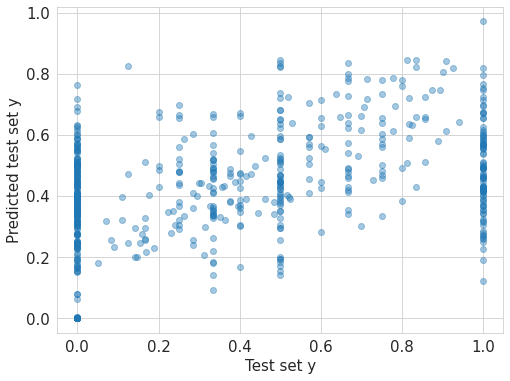

In [134]:
plt.figure(figsize = (8,6))

plt.plot(y_test, y_pred_rf, 'o', alpha = 0.4);

plt.xlabel('Test set y', fontsize = 15)
plt.ylabel('Predicted test set y', fontsize = 15)

plt.tick_params(labelsize = 15);

In [135]:
mean_squared_error(y_test, y_pred_rf, squared = False).round(3)

0.244

In [136]:
r_squared = model_rf.score(X, y)
print(r_squared)

0.7296387592174461


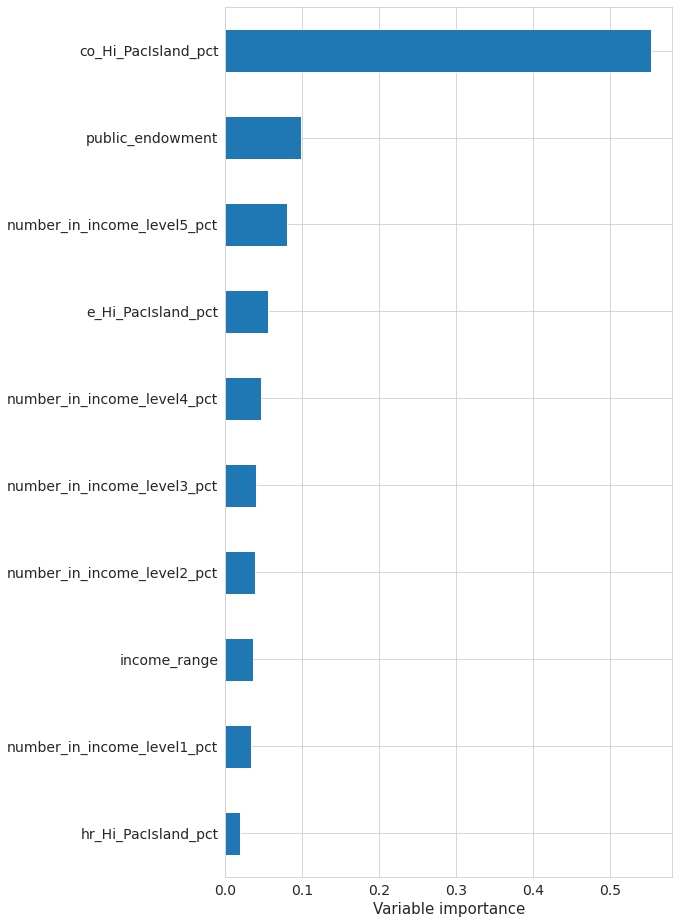

In [137]:
(pd.DataFrame(dict(cols=X_train.columns, imp=model_rf.feature_importances_)).
 sort_values(by = 'imp').
 plot('cols', 'imp', 'barh', legend = False, figsize = (8,16)))

plt.ylabel('')
plt.xlabel('Variable importance', fontsize = 15)

plt.tick_params(labelsize = 14);

## White Visualizations

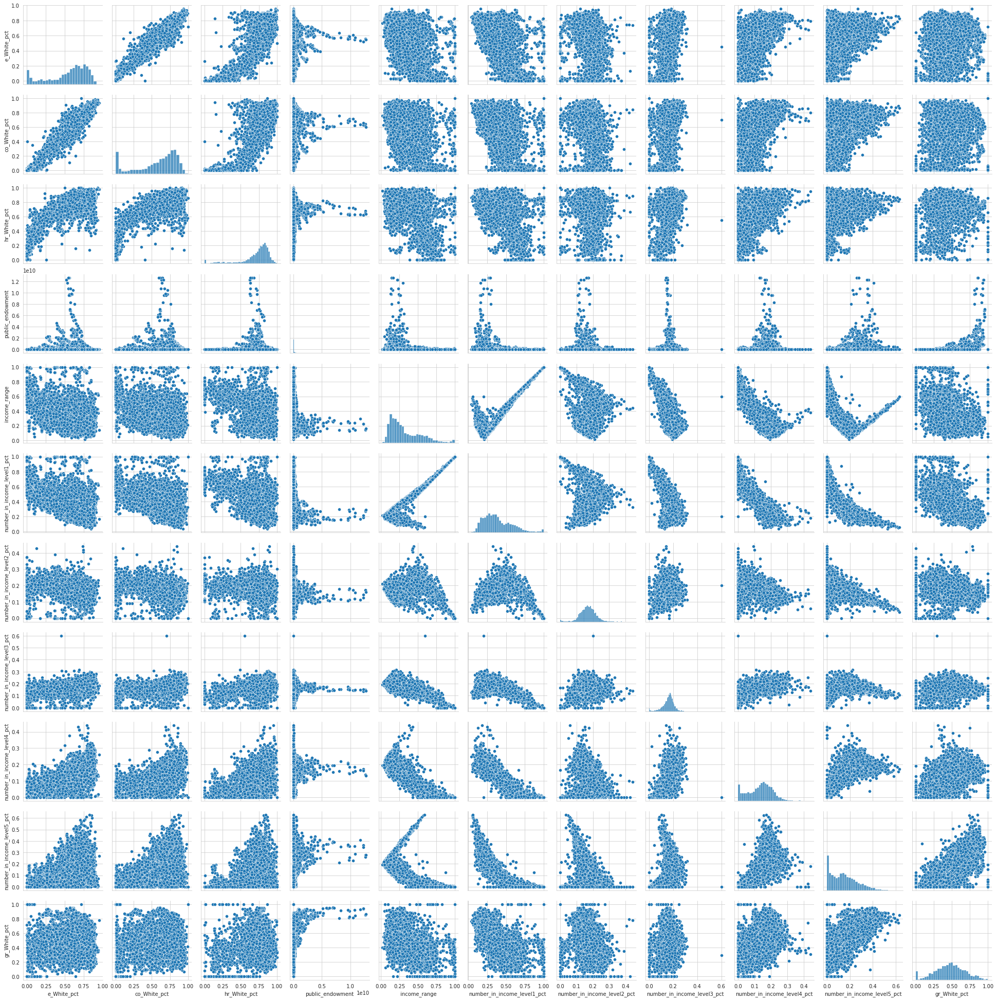

In [138]:
sns.pairplot(df[['e_White_pct', 'co_White_pct', 'hr_White_pct', 'public_endowment', 'income_range', 
                 'number_in_income_level1_pct', 'number_in_income_level2_pct', 'number_in_income_level3_pct', 'number_in_income_level4_pct', 'number_in_income_level5_pct', 'gr_White_pct']])

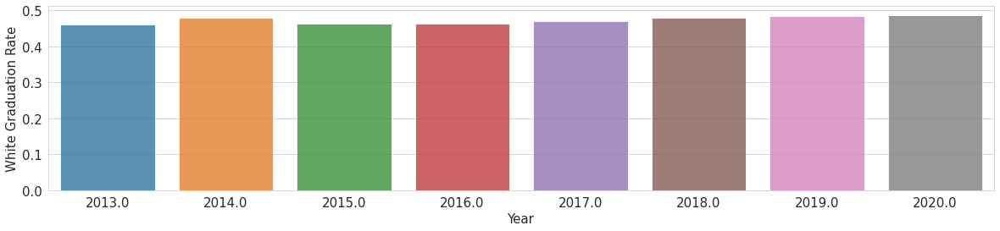

In [139]:
plt.figure(figsize = (20, 4))
df_barplot = df.groupby('year')[['year', 'gr_White_pct']].mean()
sns.barplot(data = df_barplot, x = 'year', y = 'gr_White_pct', alpha = 0.8)

plt.xlabel('Year', fontsize = 15)
plt.ylabel("White Graduation Rate", fontsize = 15)
plt.tick_params(labelsize = 15);

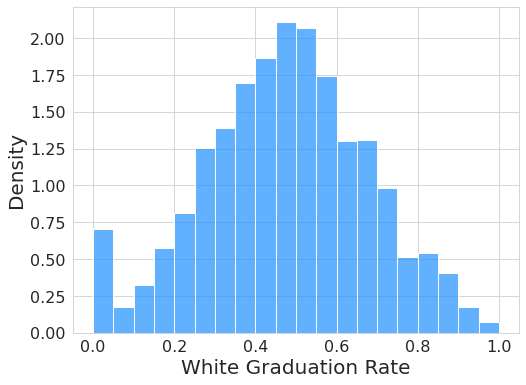

In [140]:
plt.figure(figsize = (8,6))

# Setup histogram plot
sns.histplot(data = df, x = 'gr_White_pct', bins = 20, color = 'dodgerblue', alpha = 0.7, stat = 'density')

# Label x and y axis
plt.xlabel('White Graduation Rate', fontsize = 20)
plt.ylabel('Density', fontsize = 20)

plt.tick_params(labelsize = 16)

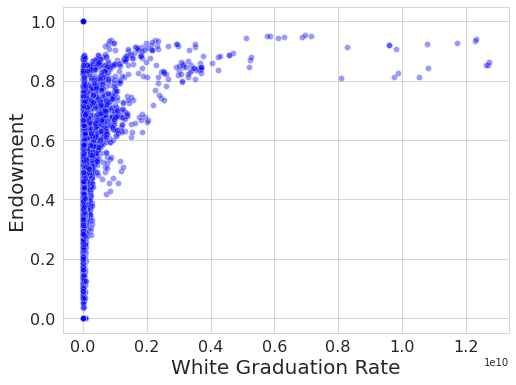

In [141]:
plt.figure(figsize = (8,6))

# Setup histogram plot
sns.scatterplot(data = df, x = 'public_endowment', y = 'gr_White_pct', color = 'blue', alpha = 0.4)

# Label x and y axis
plt.xlabel('White Graduation Rate', fontsize = 20)
plt.ylabel('Endowment', fontsize = 20)

plt.tick_params(labelsize = 16)

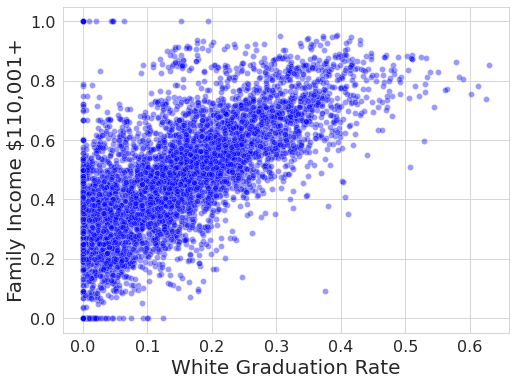

In [142]:
plt.figure(figsize = (8,6))

# Setup histogram plot
sns.scatterplot(data = df, x = 'number_in_income_level5_pct', y = 'gr_White_pct', color = 'blue', alpha = 0.4)

# Label x and y axis
plt.xlabel('White Graduation Rate', fontsize = 20)
plt.ylabel('Family Income $110,001+', fontsize = 20)

plt.tick_params(labelsize = 16)

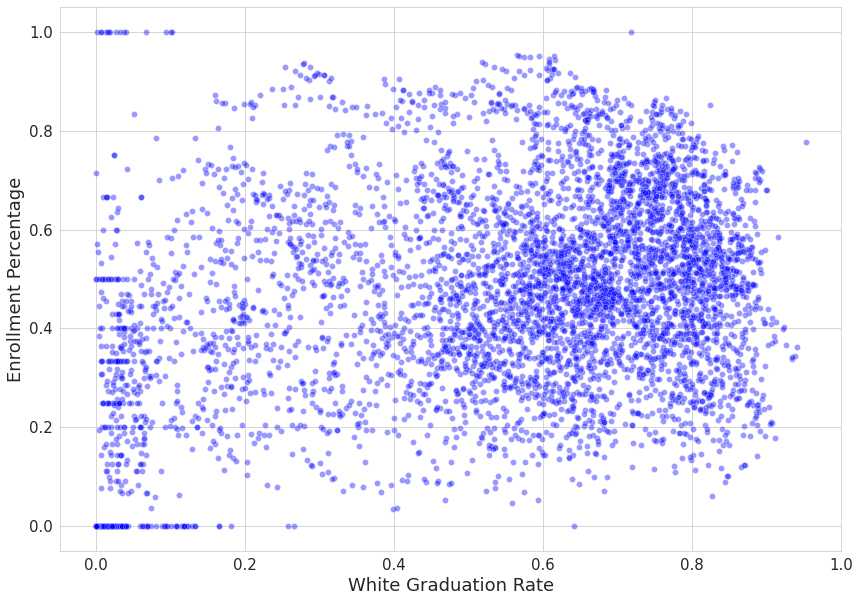

In [143]:
# Set figure size
plt.figure(figsize = (14, 10))

# Setup scatter plot for 
sns.scatterplot(data = df, x = 'e_White_pct', y = 'gr_White_pct', color = 'blue', alpha = 0.4)

# Label x and y axis
plt.xlabel('White Graduation Rate', fontsize = 18)
plt.ylabel('Enrollment Percentage', fontsize = 18)

plt.ticklabel_format(style='plain')
#plt.xlim(0.0, 1.0)
#plt.ylim(0.0, 1.0)

plt.tick_params(labelsize = 15);

## White Graduation Rate Modeling

In [144]:
df_clean = df.dropna()
X = df_clean[['e_White_pct', 'co_White_pct', 'hr_White_pct', 'public_endowment', 'income_range', 'number_in_income_level1_pct', 'number_in_income_level2_pct', 'number_in_income_level3_pct', 'number_in_income_level4_pct', 'number_in_income_level5_pct']]
y = df_clean['gr_White_pct']

In [145]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state = 1)

In [146]:
df_pred = pd.concat([X_test, y_test], axis = 1)

df_pred.head()

,e_White_pct,co_White_pct,hr_White_pct,public_endowment,income_range,number_in_income_level1_pct,number_in_income_level2_pct,number_in_income_level3_pct,number_in_income_level4_pct,number_in_income_level5_pct,gr_White_pct
3312,0.822163,0.860643,0.865116,61090095.0,0.146624,0.294304,0.204641,0.166667,0.186709,0.147679,0.507711
1932,0.782052,0.874952,0.837500,404522000.0,0.086842,0.160526,0.163158,0.184211,0.247368,0.244737,0.771153
3534,0.270986,0.239465,0.653776,44728060.0,0.313725,0.412565,0.223689,0.161665,0.103241,0.098840,0.522346
4376,0.257270,0.248524,0.648678,182002529.0,0.281174,0.383777,0.214891,0.167676,0.102603,0.131053,0.482185
211,0.748851,0.820000,0.799114,31634000.0,0.186851,0.311419,0.166090,0.202422,0.195502,0.124567,0.338753


## White Linear Regression

In [147]:
model = sm.OLS(y_train, sm.add_constant(X_train)).fit() 

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


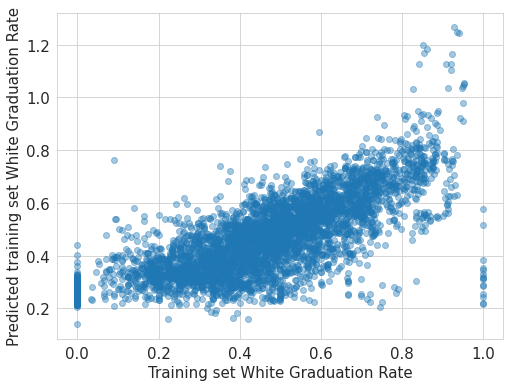

In [148]:
plt.figure(figsize = (8,6))

plt.plot(y_train, model.predict(sm.add_constant(X_train)), 'o', alpha = 0.4)

plt.xlabel('Training set White Graduation Rate', fontsize = 15)
plt.ylabel('Predicted training set White Graduation Rate', fontsize = 15)

plt.tick_params(labelsize = 15);

In [149]:
y_pred_lr = model.predict(sm.add_constant(X_test))

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


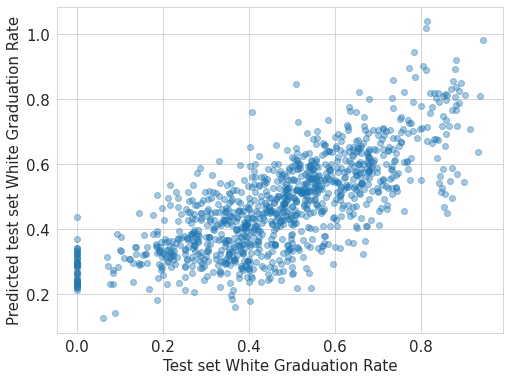

In [150]:
plt.figure(figsize = (8,6))

plt.plot(y_test, y_pred_lr, 'o', alpha = 0.4);

plt.xlabel('Test set White Graduation Rate', fontsize = 15)
plt.ylabel('Predicted test set White Graduation Rate', fontsize = 15)

plt.tick_params(labelsize = 15)

In [151]:
# Mean Squared Error
mean_squared_error(y_test, y_pred_lr, squared = False).round(3)

0.134

In [152]:
# Mean Absolute Error
mean_absolute_error(y_test, y_pred_lr).round(3)

0.105

In [153]:
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:           gr_White_pct   R-squared:                       0.540
Model:                            OLS   Adj. R-squared:                  0.539
Method:                 Least Squares   F-statistic:                     565.2
Date:                Thu, 08 Dec 2022   Prob (F-statistic):               0.00
Time:                        00:20:37   Log-Likelihood:                 2448.0
No. Observations:                4348   AIC:                            -4876.
Df Residuals:                    4338   BIC:                            -4812.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

## White Random Forest

In [154]:
model_rf = RandomForestRegressor(100, min_samples_leaf=5)

In [155]:
model_rf.fit(X_train, y_train)

RandomForestRegressor(min_samples_leaf=5)

In [156]:
y_pred_rf = model_rf.predict(X_test)

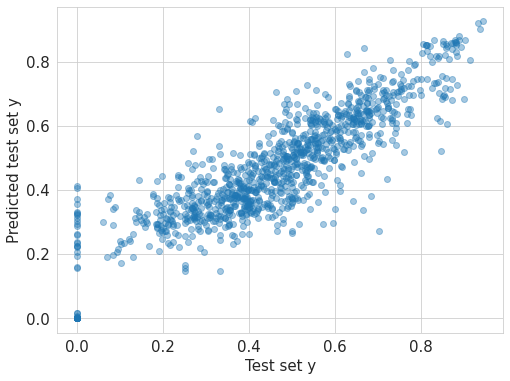

In [157]:
plt.figure(figsize = (8,6))

plt.plot(y_test, y_pred_rf, 'o', alpha = 0.4);

plt.xlabel('Test set y', fontsize = 15)
plt.ylabel('Predicted test set y', fontsize = 15)

plt.tick_params(labelsize = 15);

In [158]:
mean_squared_error(y_test, y_pred_rf, squared = False).round(3)

0.101

In [159]:
r_squared = model_rf.score(X, y)
print(r_squared)

0.8543248972094465


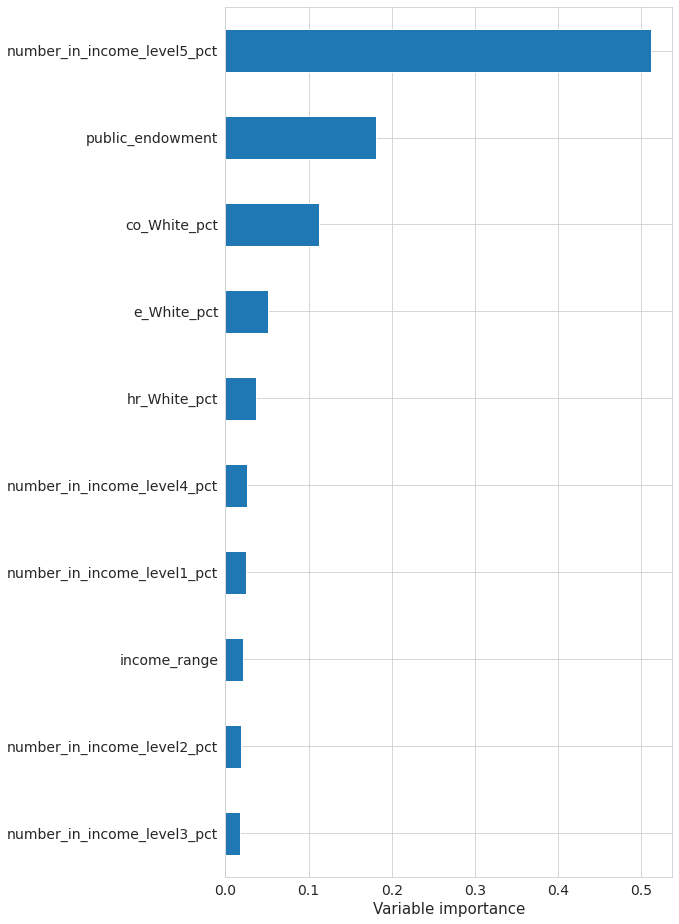

In [160]:
(pd.DataFrame(dict(cols=X_train.columns, imp=model_rf.feature_importances_)).
 sort_values(by = 'imp').
 plot('cols', 'imp', 'barh', legend = False, figsize = (8,16)))

plt.ylabel('')
plt.xlabel('Variable importance', fontsize = 15)

plt.tick_params(labelsize = 14);

## 2 or More Visualizations

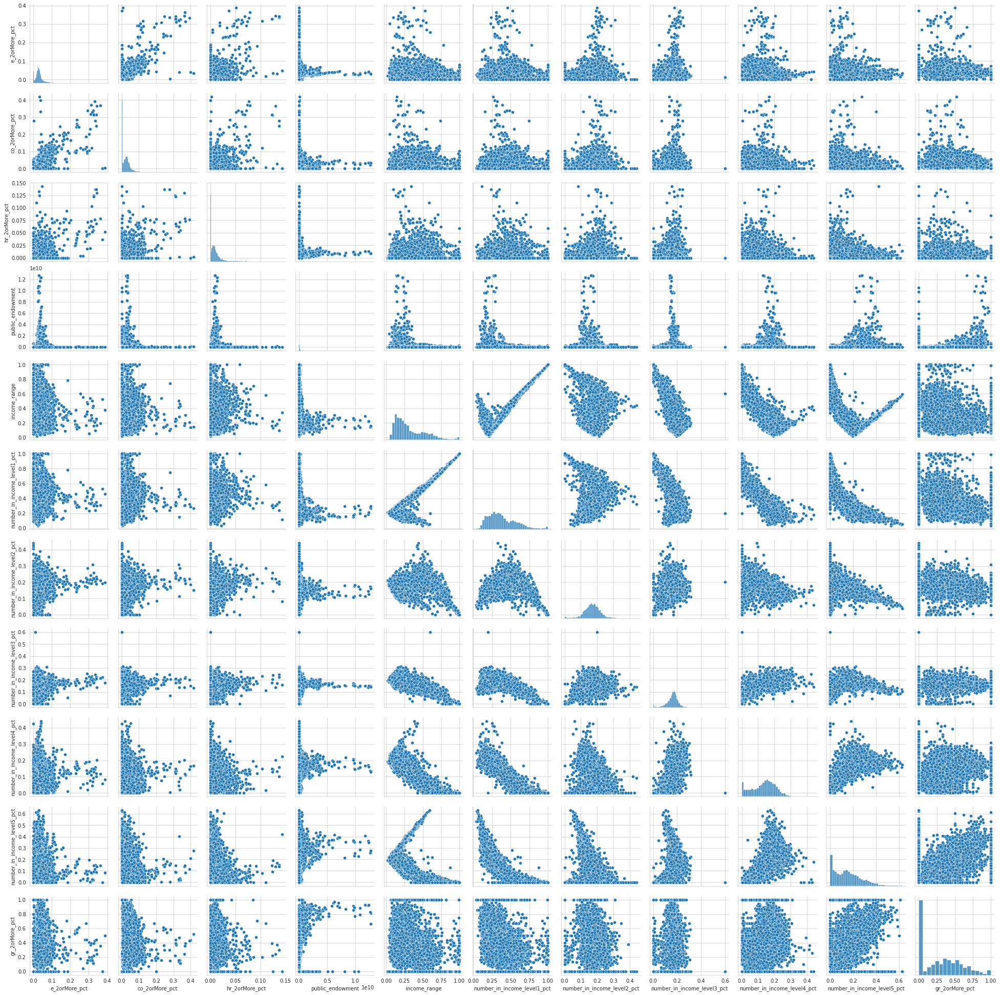

In [161]:
sns.pairplot(df[['e_2orMore_pct', 'co_2orMore_pct', 'hr_2orMore_pct', 'public_endowment', 'income_range', 
                 'number_in_income_level1_pct', 'number_in_income_level2_pct', 'number_in_income_level3_pct', 'number_in_income_level4_pct', 'number_in_income_level5_pct', 'gr_2orMore_pct']])

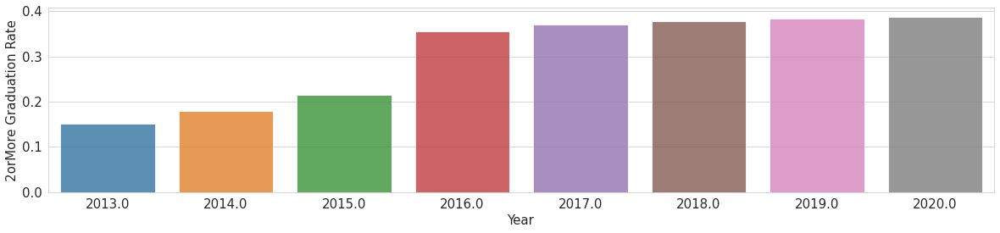

In [162]:
plt.figure(figsize = (20, 4))
df_barplot = df.groupby('year')[['year', 'gr_2orMore_pct']].mean()
sns.barplot(data = df_barplot, x = 'year', y = 'gr_2orMore_pct', alpha = 0.8)

plt.xlabel('Year', fontsize = 15)
plt.ylabel("2orMore Graduation Rate", fontsize = 15)
plt.tick_params(labelsize = 15);

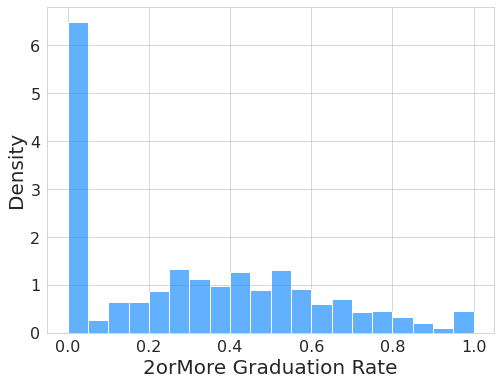

In [163]:
plt.figure(figsize = (8,6))

# Setup histogram plot
sns.histplot(data = df, x = 'gr_2orMore_pct', bins = 20, color = 'dodgerblue', alpha = 0.7, stat = 'density')

# Label x and y axis
plt.xlabel('2orMore Graduation Rate', fontsize = 20)
plt.ylabel('Density', fontsize = 20)

plt.tick_params(labelsize = 16)

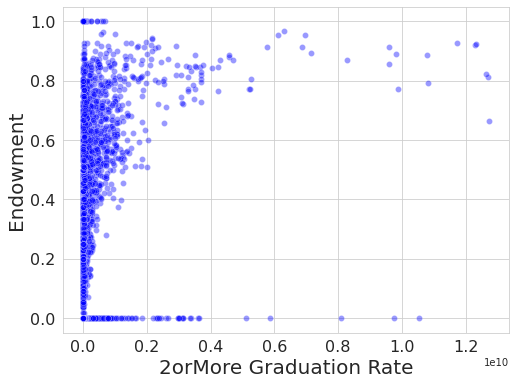

In [164]:
plt.figure(figsize = (8,6))

# Setup histogram plot
sns.scatterplot(data = df, x = 'public_endowment', y = 'gr_2orMore_pct', color = 'blue', alpha = 0.4)

# Label x and y axis
plt.xlabel('2orMore Graduation Rate', fontsize = 20)
plt.ylabel('Endowment', fontsize = 20)

plt.tick_params(labelsize = 16)

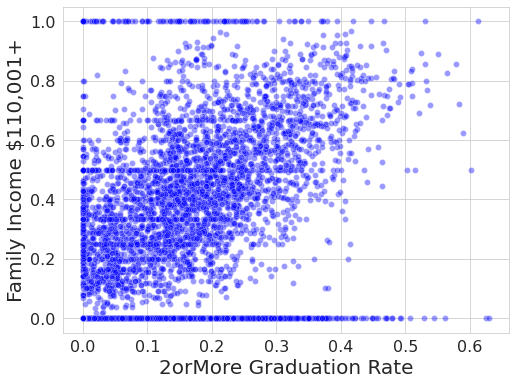

In [165]:
plt.figure(figsize = (8,6))

# Setup histogram plot
sns.scatterplot(data = df, x = 'number_in_income_level5_pct', y = 'gr_2orMore_pct', color = 'blue', alpha = 0.4)

# Label x and y axis
plt.xlabel('2orMore Graduation Rate', fontsize = 20)
plt.ylabel('Family Income $110,001+', fontsize = 20)

plt.tick_params(labelsize = 16)

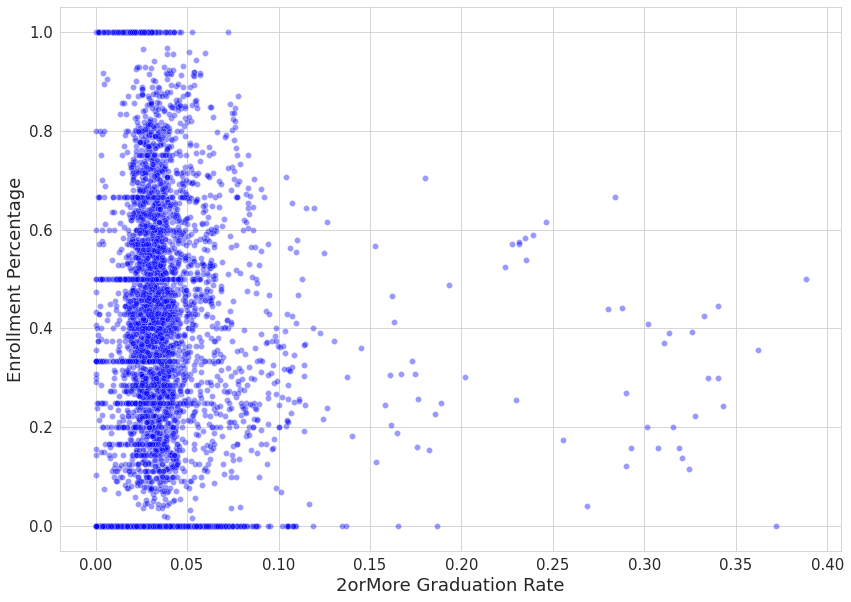

In [166]:
# Set figure size
plt.figure(figsize = (14, 10))

# Setup scatter plot for 
sns.scatterplot(data = df, x = 'e_2orMore_pct', y = 'gr_2orMore_pct', color = 'blue', alpha = 0.4)

# Label x and y axis
plt.xlabel('2orMore Graduation Rate', fontsize = 18)
plt.ylabel('Enrollment Percentage', fontsize = 18)

plt.ticklabel_format(style='plain')
#plt.xlim(0.0, 1.0)
#plt.ylim(0.0, 1.0)

plt.tick_params(labelsize = 15);

## 2 or More Graduation Rate Modeling

In [167]:
df_clean = df.dropna()
X = df_clean[['e_2orMore_pct', 'co_2orMore_pct', 'hr_2orMore_pct', 'public_endowment', 'income_range', 'number_in_income_level1_pct', 'number_in_income_level2_pct', 'number_in_income_level3_pct', 'number_in_income_level4_pct', 'number_in_income_level5_pct']]
y = df_clean['gr_2orMore_pct']

In [168]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state = 1)

In [169]:
df_pred = pd.concat([X_test, y_test], axis = 1)

df_pred.head()

,e_2orMore_pct,co_2orMore_pct,hr_2orMore_pct,public_endowment,income_range,number_in_income_level1_pct,number_in_income_level2_pct,number_in_income_level3_pct,number_in_income_level4_pct,number_in_income_level5_pct,gr_2orMore_pct
3312,0.032845,0.013783,0.018605,61090095.0,0.146624,0.294304,0.204641,0.166667,0.186709,0.147679,0.444444
1932,0.026687,0.000000,0.007639,404522000.0,0.086842,0.160526,0.163158,0.184211,0.247368,0.244737,0.000000
3534,0.060874,0.066555,0.011480,44728060.0,0.313725,0.412565,0.223689,0.161665,0.103241,0.098840,0.512563
4376,0.057504,0.063459,0.009912,182002529.0,0.281174,0.383777,0.214891,0.167676,0.102603,0.131053,0.465116
211,0.015017,0.000000,0.002954,31634000.0,0.186851,0.311419,0.166090,0.202422,0.195502,0.124567,0.000000


## 2 or More Linear Regression

In [170]:
model = sm.OLS(y_train, sm.add_constant(X_train)).fit() 

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


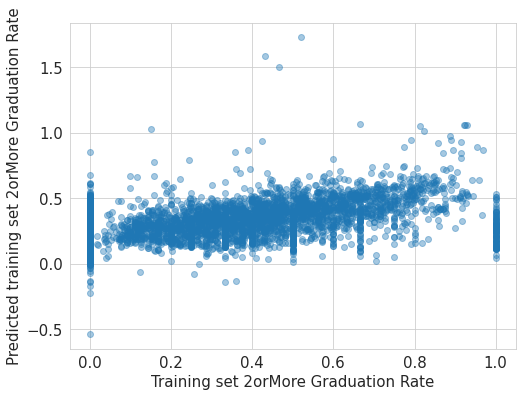

In [171]:
plt.figure(figsize = (8,6))

plt.plot(y_train, model.predict(sm.add_constant(X_train)), 'o', alpha = 0.4)

plt.xlabel('Training set 2orMore Graduation Rate', fontsize = 15)
plt.ylabel('Predicted training set 2orMore Graduation Rate', fontsize = 15)

plt.tick_params(labelsize = 15);

In [172]:
y_pred_lr = model.predict(sm.add_constant(X_test))

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


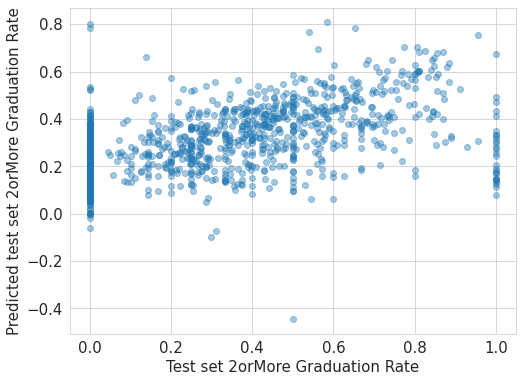

In [173]:
plt.figure(figsize = (8,6))

plt.plot(y_test, y_pred_lr, 'o', alpha = 0.4);

plt.xlabel('Test set 2orMore Graduation Rate', fontsize = 15)
plt.ylabel('Predicted test set 2orMore Graduation Rate', fontsize = 15)

plt.tick_params(labelsize = 15)

In [174]:
# Mean Squared Error
mean_squared_error(y_test, y_pred_lr, squared = False).round(3)

0.237

In [175]:
# Mean Absolute Error
mean_absolute_error(y_test, y_pred_lr).round(3)

0.181

In [176]:
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:         gr_2orMore_pct   R-squared:                       0.306
Model:                            OLS   Adj. R-squared:                  0.304
Method:                 Least Squares   F-statistic:                     212.1
Date:                Thu, 08 Dec 2022   Prob (F-statistic):               0.00
Time:                        00:22:23   Log-Likelihood:                 173.52
No. Observations:                4348   AIC:                            -327.0
Df Residuals:                    4338   BIC:                            -263.3
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

## 2 or More Random Forest

In [177]:
model_rf = RandomForestRegressor(100, min_samples_leaf=5)

In [178]:
model_rf.fit(X_train, y_train)

RandomForestRegressor(min_samples_leaf=5)

In [179]:
y_pred_rf = model_rf.predict(X_test)

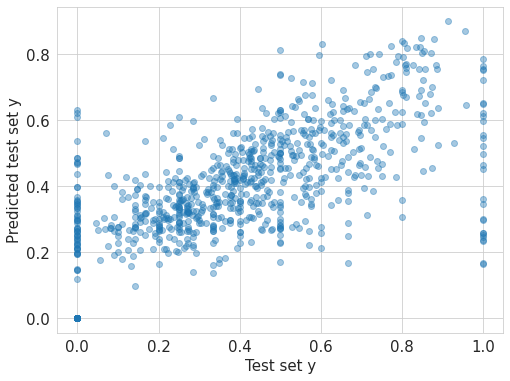

In [180]:
plt.figure(figsize = (8,6))

plt.plot(y_test, y_pred_rf, 'o', alpha = 0.4);

plt.xlabel('Test set y', fontsize = 15)
plt.ylabel('Predicted test set y', fontsize = 15)

plt.tick_params(labelsize = 15);

In [181]:
mean_squared_error(y_test, y_pred_rf, squared = False).round(3)

0.167

In [182]:
r_squared = model_rf.score(X, y)
print(r_squared)

0.8215015236062304


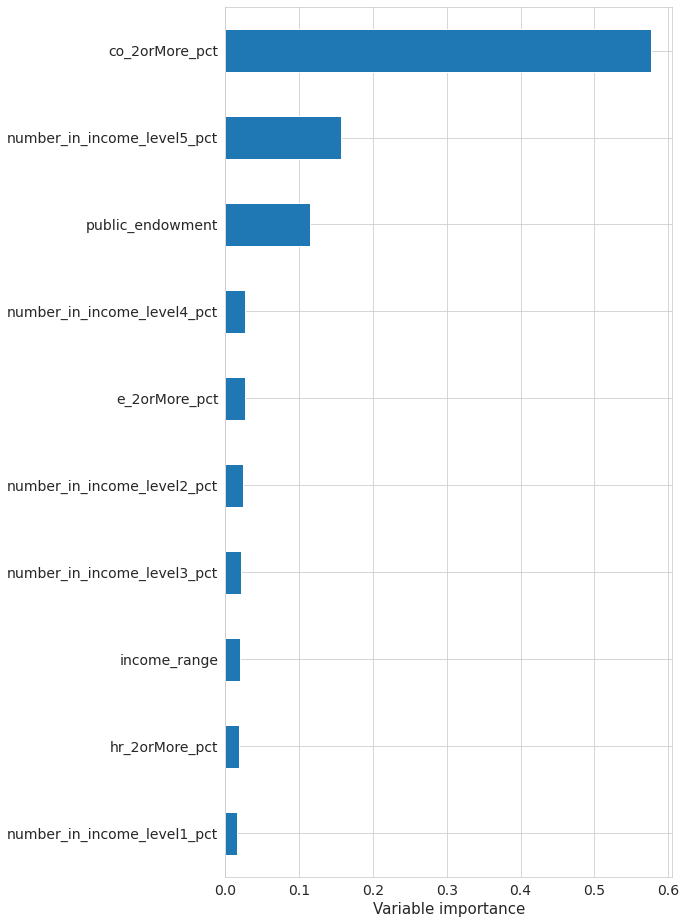

In [183]:
(pd.DataFrame(dict(cols=X_train.columns, imp=model_rf.feature_importances_)).
 sort_values(by = 'imp').
 plot('cols', 'imp', 'barh', legend = False, figsize = (8,16)))

plt.ylabel('')
plt.xlabel('Variable importance', fontsize = 15)

plt.tick_params(labelsize = 14);